In [ ]:
!pip install opendatasets --upgrade --quiet

In [ ]:
import opendatasets as od

In [ ]:
dataset_url = 'https://www.kaggle.com/datasets/kushal1506/jamini-roy-paintings?select=jamini_roy_jpg'

In [ ]:
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: vighneshvmandavkar
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/kushal1506/jamini-roy-paintings


100%|██████████| 271M/271M [00:04<00:00, 63.1MB/s]


In [ ]:
data_dir = '/content/jamini-roy-paintings/jamini_roy_jpg'

In [ ]:
import os

In [ ]:
for cls in os.listdir(data_dir):
  print(cls, ':', len(os.listdir(data_dir + '/' + cls)))

jamini_roy_jpg : 770


In [ ]:
from torchvision.datasets import ImageFolder

In [ ]:
dataset = ImageFolder(data_dir)

In [ ]:
len(dataset)

770

In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
import matplotlib.pyplot as plt

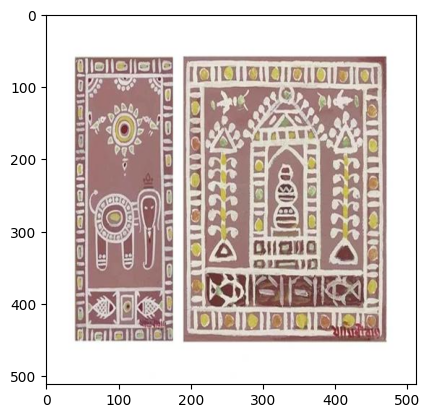

In [ ]:
img, label = dataset[2]
plt.imshow(img)

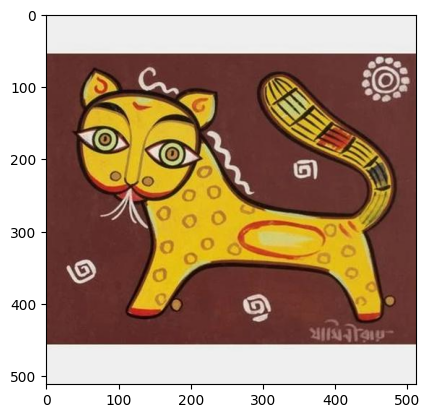

In [ ]:
img, label = dataset[25]
plt.imshow(img)

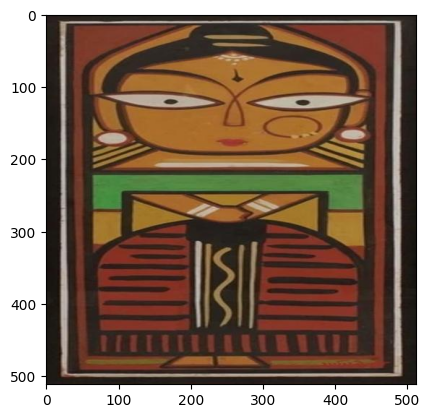

In [ ]:
img, label = dataset[14]
plt.imshow(img)

In [ ]:
import torchvision.transforms as tt
from torch.utils.data import DataLoader

In [ ]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [ ]:
train_ds = ImageFolder(data_dir, transform=tt.Compose([
    tt.Resize(image_size),
    tt.CenterCrop(image_size),
    tt.ToTensor(),
    tt.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
from torchvision.utils import make_grid

In [ ]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [ ]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

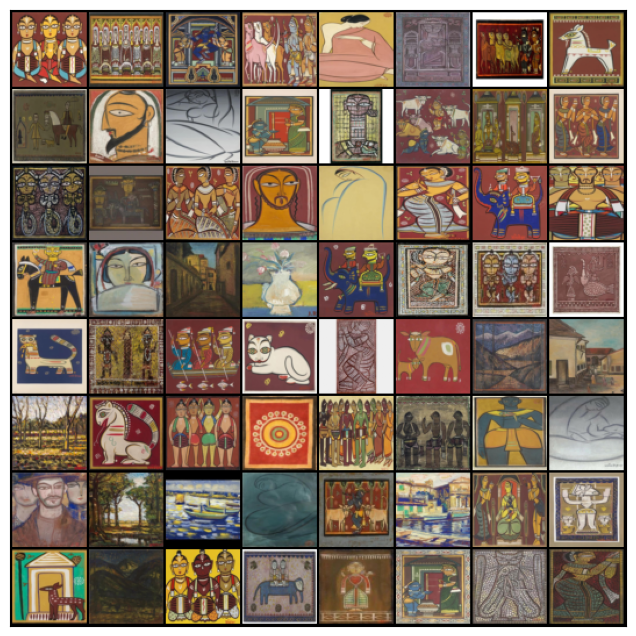

In [ ]:
show_batch(train_dl)

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
import torch

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)

In [ ]:
import torch.nn as nn

In [ ]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
latent_size = 128

In [ ]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

torch.Size([128, 3, 64, 64])


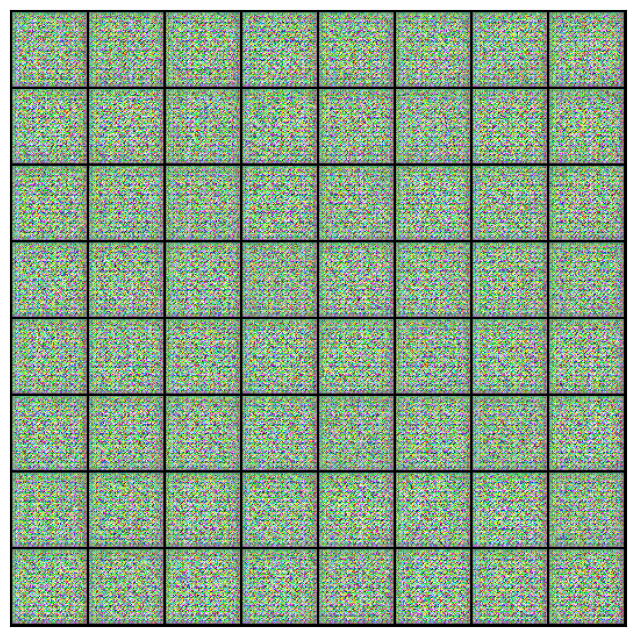

In [ ]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

In [ ]:
generator = to_device(generator, device)

In [ ]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [ ]:
from torchvision.utils import save_image

In [ ]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(8, 8))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(fake_images.cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


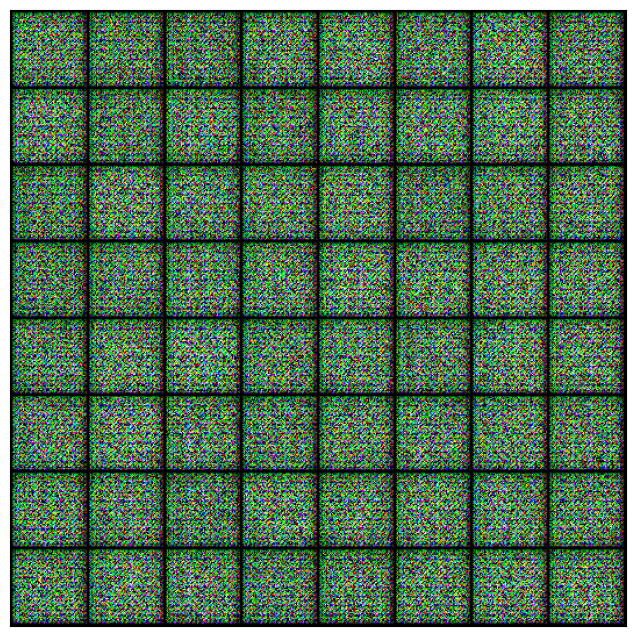

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [ ]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

In [ ]:
lr = 0.00001
epochs = 700

In [ ]:
history = fit(epochs, lr)

  0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


Epoch [1/700], loss_g: 0.8571, loss_d: 1.1572, real_score: 0.5794, fake_score: 0.4507
Saving generated-images-0001.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [2/700], loss_g: 0.9172, loss_d: 1.3676, real_score: 0.4657, fake_score: 0.4205
Saving generated-images-0002.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [3/700], loss_g: 0.9043, loss_d: 1.1392, real_score: 0.5819, fake_score: 0.4333
Saving generated-images-0003.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [4/700], loss_g: 0.9507, loss_d: 1.2434, real_score: 0.5347, fake_score: 0.4206
Saving generated-images-0004.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [5/700], loss_g: 0.9508, loss_d: 1.2555, real_score: 0.5031, fake_score: 0.4145
Saving generated-images-0005.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [6/700], loss_g: 0.9858, loss_d: 1.3012, real_score: 0.4730, fake_score: 0.4173
Saving generated-images-0006.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [7/700], loss_g: 0.9799, loss_d: 0.8268, real_score: 0.7437, fake_score: 0.4003
Saving generated-images-0007.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [8/700], loss_g: 1.0834, loss_d: 0.9176, real_score: 0.6579, fake_score: 0.3871
Saving generated-images-0008.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [9/700], loss_g: 1.0616, loss_d: 1.0562, real_score: 0.5740, fake_score: 0.3884
Saving generated-images-0009.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [10/700], loss_g: 1.0870, loss_d: 1.0088, real_score: 0.6017, fake_score: 0.3819
Saving generated-images-0010.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [11/700], loss_g: 1.1426, loss_d: 0.9920, real_score: 0.6119, fake_score: 0.3679
Saving generated-images-0011.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [12/700], loss_g: 1.1491, loss_d: 1.3966, real_score: 0.4620, fake_score: 0.3544
Saving generated-images-0012.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [13/700], loss_g: 1.1921, loss_d: 1.0413, real_score: 0.5433, fake_score: 0.3432
Saving generated-images-0013.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [14/700], loss_g: 1.2314, loss_d: 0.6735, real_score: 0.7773, fake_score: 0.3383
Saving generated-images-0014.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [15/700], loss_g: 1.2270, loss_d: 1.2635, real_score: 0.4210, fake_score: 0.3255
Saving generated-images-0015.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [16/700], loss_g: 1.2531, loss_d: 1.0562, real_score: 0.5326, fake_score: 0.3411
Saving generated-images-0016.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [17/700], loss_g: 1.2594, loss_d: 1.0708, real_score: 0.5327, fake_score: 0.3297
Saving generated-images-0017.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [18/700], loss_g: 1.2950, loss_d: 0.8342, real_score: 0.6425, fake_score: 0.3204
Saving generated-images-0018.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [19/700], loss_g: 1.3689, loss_d: 1.3345, real_score: 0.4814, fake_score: 0.2894
Saving generated-images-0019.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [20/700], loss_g: 1.4644, loss_d: 0.9664, real_score: 0.5396, fake_score: 0.2902
Saving generated-images-0020.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [21/700], loss_g: 1.4577, loss_d: 1.3372, real_score: 0.3677, fake_score: 0.2735
Saving generated-images-0021.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [22/700], loss_g: 1.4866, loss_d: 0.6365, real_score: 0.7387, fake_score: 0.2755
Saving generated-images-0022.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [23/700], loss_g: 1.5090, loss_d: 0.7139, real_score: 0.6779, fake_score: 0.2664
Saving generated-images-0023.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [24/700], loss_g: 1.5346, loss_d: 0.9264, real_score: 0.5334, fake_score: 0.2545
Saving generated-images-0024.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [25/700], loss_g: 1.6195, loss_d: 0.7794, real_score: 0.6345, fake_score: 0.2394
Saving generated-images-0025.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [26/700], loss_g: 1.5893, loss_d: 1.0298, real_score: 0.4699, fake_score: 0.2377
Saving generated-images-0026.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [27/700], loss_g: 1.6956, loss_d: 0.4025, real_score: 0.8758, fake_score: 0.2340
Saving generated-images-0027.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [28/700], loss_g: 1.6882, loss_d: 0.8150, real_score: 0.5862, fake_score: 0.2356
Saving generated-images-0028.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [29/700], loss_g: 1.7087, loss_d: 1.0602, real_score: 0.5288, fake_score: 0.2340
Saving generated-images-0029.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [30/700], loss_g: 1.7020, loss_d: 1.1091, real_score: 0.4396, fake_score: 0.2228
Saving generated-images-0030.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [31/700], loss_g: 1.7599, loss_d: 0.7091, real_score: 0.6496, fake_score: 0.2236
Saving generated-images-0031.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [32/700], loss_g: 1.8329, loss_d: 0.4596, real_score: 0.8178, fake_score: 0.2249
Saving generated-images-0032.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [33/700], loss_g: 1.8272, loss_d: 0.7760, real_score: 0.6022, fake_score: 0.2134
Saving generated-images-0033.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [34/700], loss_g: 1.8645, loss_d: 0.6753, real_score: 0.6592, fake_score: 0.1930
Saving generated-images-0034.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [35/700], loss_g: 1.8503, loss_d: 1.1374, real_score: 0.4075, fake_score: 0.1990
Saving generated-images-0035.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [36/700], loss_g: 1.8983, loss_d: 0.5070, real_score: 0.7764, fake_score: 0.2156
Saving generated-images-0036.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [37/700], loss_g: 1.9268, loss_d: 0.6076, real_score: 0.6951, fake_score: 0.2076
Saving generated-images-0037.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [38/700], loss_g: 1.9967, loss_d: 0.5411, real_score: 0.7207, fake_score: 0.1896
Saving generated-images-0038.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [39/700], loss_g: 2.1586, loss_d: 0.2467, real_score: 0.9418, fake_score: 0.1691
Saving generated-images-0039.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [40/700], loss_g: 2.1533, loss_d: 0.2850, real_score: 0.9078, fake_score: 0.1692
Saving generated-images-0040.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [41/700], loss_g: 2.0892, loss_d: 0.8285, real_score: 0.5439, fake_score: 0.1663
Saving generated-images-0041.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [42/700], loss_g: 2.1262, loss_d: 1.2433, real_score: 0.3924, fake_score: 0.1626
Saving generated-images-0042.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [43/700], loss_g: 2.2038, loss_d: 0.2591, real_score: 0.9137, fake_score: 0.1546
Saving generated-images-0043.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [44/700], loss_g: 2.2223, loss_d: 0.2672, real_score: 0.9152, fake_score: 0.1619
Saving generated-images-0044.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [45/700], loss_g: 2.2379, loss_d: 0.4404, real_score: 0.7689, fake_score: 0.1556
Saving generated-images-0045.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [46/700], loss_g: 2.3131, loss_d: 0.3226, real_score: 0.8577, fake_score: 0.1546
Saving generated-images-0046.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [47/700], loss_g: 2.1719, loss_d: 0.7519, real_score: 0.5889, fake_score: 0.1593
Saving generated-images-0047.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [48/700], loss_g: 2.1952, loss_d: 0.4185, real_score: 0.8011, fake_score: 0.1595
Saving generated-images-0048.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [49/700], loss_g: 2.3335, loss_d: 0.2317, real_score: 0.9417, fake_score: 0.1566
Saving generated-images-0049.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [50/700], loss_g: 2.2526, loss_d: 1.1576, real_score: 0.5132, fake_score: 0.1394
Saving generated-images-0050.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [51/700], loss_g: 2.3225, loss_d: 0.5161, real_score: 0.7177, fake_score: 0.1394
Saving generated-images-0051.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [52/700], loss_g: 2.3835, loss_d: 0.5182, real_score: 0.6912, fake_score: 0.1356
Saving generated-images-0052.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [53/700], loss_g: 2.3954, loss_d: 0.4609, real_score: 0.7545, fake_score: 0.1294
Saving generated-images-0053.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [54/700], loss_g: 2.4964, loss_d: 0.1856, real_score: 0.9441, fake_score: 0.1194
Saving generated-images-0054.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [55/700], loss_g: 2.5204, loss_d: 0.3176, real_score: 0.8325, fake_score: 0.1238
Saving generated-images-0055.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [56/700], loss_g: 2.5027, loss_d: 0.3337, real_score: 0.8247, fake_score: 0.1248
Saving generated-images-0056.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [57/700], loss_g: 2.4035, loss_d: 1.2142, real_score: 0.3480, fake_score: 0.1244
Saving generated-images-0057.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [58/700], loss_g: 2.5118, loss_d: 0.4097, real_score: 0.7615, fake_score: 0.1251
Saving generated-images-0058.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [59/700], loss_g: 2.5477, loss_d: 0.5889, real_score: 0.6297, fake_score: 0.1181
Saving generated-images-0059.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [60/700], loss_g: 2.6037, loss_d: 0.2962, real_score: 0.8437, fake_score: 0.1158
Saving generated-images-0060.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [61/700], loss_g: 2.6297, loss_d: 0.2058, real_score: 0.9217, fake_score: 0.1143
Saving generated-images-0061.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [62/700], loss_g: 2.6205, loss_d: 0.6201, real_score: 0.6013, fake_score: 0.1032
Saving generated-images-0062.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [63/700], loss_g: 2.6780, loss_d: 0.3588, real_score: 0.7844, fake_score: 0.1091
Saving generated-images-0063.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [64/700], loss_g: 2.6389, loss_d: 0.4822, real_score: 0.7002, fake_score: 0.1085
Saving generated-images-0064.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [65/700], loss_g: 2.6741, loss_d: 0.2324, real_score: 0.8872, fake_score: 0.1028
Saving generated-images-0065.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [66/700], loss_g: 2.6415, loss_d: 0.7143, real_score: 0.5856, fake_score: 0.0963
Saving generated-images-0066.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [67/700], loss_g: 2.6154, loss_d: 0.6704, real_score: 0.5795, fake_score: 0.1015
Saving generated-images-0067.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [68/700], loss_g: 2.5433, loss_d: 1.0976, real_score: 0.3831, fake_score: 0.1238
Saving generated-images-0068.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [69/700], loss_g: 2.5467, loss_d: 0.4657, real_score: 0.7288, fake_score: 0.1247
Saving generated-images-0069.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [70/700], loss_g: 2.5979, loss_d: 0.4325, real_score: 0.7454, fake_score: 0.1100
Saving generated-images-0070.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [71/700], loss_g: 2.5978, loss_d: 0.2583, real_score: 0.8873, fake_score: 0.1247
Saving generated-images-0071.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [72/700], loss_g: 2.6824, loss_d: 0.3461, real_score: 0.7998, fake_score: 0.1127
Saving generated-images-0072.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [73/700], loss_g: 2.6393, loss_d: 0.7745, real_score: 0.5168, fake_score: 0.1037
Saving generated-images-0073.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [74/700], loss_g: 2.8214, loss_d: 0.1197, real_score: 0.9786, fake_score: 0.0931
Saving generated-images-0074.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [75/700], loss_g: 2.7192, loss_d: 0.5454, real_score: 0.6920, fake_score: 0.0917
Saving generated-images-0075.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [76/700], loss_g: 2.7772, loss_d: 0.4676, real_score: 0.7046, fake_score: 0.0871
Saving generated-images-0076.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [77/700], loss_g: 2.8969, loss_d: 0.1095, real_score: 0.9817, fake_score: 0.0868
Saving generated-images-0077.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [78/700], loss_g: 2.7951, loss_d: 0.6291, real_score: 0.6549, fake_score: 0.0859
Saving generated-images-0078.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [79/700], loss_g: 2.8785, loss_d: 0.1887, real_score: 0.9079, fake_score: 0.0868
Saving generated-images-0079.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [80/700], loss_g: 2.9022, loss_d: 0.1985, real_score: 0.8985, fake_score: 0.0872
Saving generated-images-0080.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [81/700], loss_g: 2.9632, loss_d: 0.1507, real_score: 0.9343, fake_score: 0.0792
Saving generated-images-0081.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [82/700], loss_g: 2.8504, loss_d: 0.3694, real_score: 0.7631, fake_score: 0.0802
Saving generated-images-0082.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [83/700], loss_g: 2.7888, loss_d: 1.1393, real_score: 0.3638, fake_score: 0.0824
Saving generated-images-0083.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [84/700], loss_g: 2.9791, loss_d: 0.1613, real_score: 0.9270, fake_score: 0.0805
Saving generated-images-0084.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [85/700], loss_g: 2.9396, loss_d: 0.5642, real_score: 0.6331, fake_score: 0.0804
Saving generated-images-0085.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [86/700], loss_g: 2.7312, loss_d: 1.1586, real_score: 0.5413, fake_score: 0.0731
Saving generated-images-0086.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [87/700], loss_g: 3.0767, loss_d: 0.1032, real_score: 0.9738, fake_score: 0.0736
Saving generated-images-0087.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [88/700], loss_g: 2.8817, loss_d: 0.5365, real_score: 0.6338, fake_score: 0.0766
Saving generated-images-0088.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [89/700], loss_g: 2.7355, loss_d: 1.7710, real_score: 0.2041, fake_score: 0.0702
Saving generated-images-0089.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [90/700], loss_g: 3.0845, loss_d: 0.1042, real_score: 0.9688, fake_score: 0.0696
Saving generated-images-0090.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [91/700], loss_g: 2.9547, loss_d: 0.2266, real_score: 0.8739, fake_score: 0.0822
Saving generated-images-0091.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [92/700], loss_g: 2.9730, loss_d: 0.1512, real_score: 0.9374, fake_score: 0.0824
Saving generated-images-0092.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [93/700], loss_g: 2.9934, loss_d: 0.1650, real_score: 0.9207, fake_score: 0.0787
Saving generated-images-0093.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [94/700], loss_g: 3.0138, loss_d: 0.2307, real_score: 0.8551, fake_score: 0.0713
Saving generated-images-0094.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [95/700], loss_g: 3.0335, loss_d: 0.2928, real_score: 0.8181, fake_score: 0.0719
Saving generated-images-0095.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [96/700], loss_g: 2.7892, loss_d: 2.1146, real_score: 0.2206, fake_score: 0.0757
Saving generated-images-0096.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [97/700], loss_g: 3.0362, loss_d: 0.2118, real_score: 0.8795, fake_score: 0.0777
Saving generated-images-0097.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [98/700], loss_g: 2.7985, loss_d: 0.7067, real_score: 0.5541, fake_score: 0.0830
Saving generated-images-0098.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [99/700], loss_g: 2.7571, loss_d: 1.1776, real_score: 0.3500, fake_score: 0.0922
Saving generated-images-0099.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [100/700], loss_g: 2.9422, loss_d: 0.3621, real_score: 0.7630, fake_score: 0.0869
Saving generated-images-0100.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [101/700], loss_g: 2.8417, loss_d: 0.5575, real_score: 0.6373, fake_score: 0.0831
Saving generated-images-0101.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [102/700], loss_g: 2.9958, loss_d: 0.2701, real_score: 0.8357, fake_score: 0.0834
Saving generated-images-0102.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [103/700], loss_g: 2.9834, loss_d: 0.1056, real_score: 0.9793, fake_score: 0.0811
Saving generated-images-0103.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [104/700], loss_g: 2.8667, loss_d: 0.7697, real_score: 0.5745, fake_score: 0.0836
Saving generated-images-0104.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [105/700], loss_g: 3.0375, loss_d: 0.4107, real_score: 0.7187, fake_score: 0.0750
Saving generated-images-0105.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [106/700], loss_g: 3.0193, loss_d: 0.2162, real_score: 0.8657, fake_score: 0.0681
Saving generated-images-0106.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [107/700], loss_g: 3.1172, loss_d: 0.0997, real_score: 0.9719, fake_score: 0.0687
Saving generated-images-0107.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [108/700], loss_g: 3.0987, loss_d: 0.1000, real_score: 0.9712, fake_score: 0.0679
Saving generated-images-0108.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [109/700], loss_g: 2.9139, loss_d: 0.8578, real_score: 0.5576, fake_score: 0.0763
Saving generated-images-0109.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [110/700], loss_g: 3.0423, loss_d: 0.3215, real_score: 0.7858, fake_score: 0.0771
Saving generated-images-0110.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [111/700], loss_g: 2.8163, loss_d: 1.5557, real_score: 0.2630, fake_score: 0.0755
Saving generated-images-0111.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [112/700], loss_g: 3.1421, loss_d: 0.1237, real_score: 0.9520, fake_score: 0.0714
Saving generated-images-0112.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [113/700], loss_g: 2.8528, loss_d: 0.9096, real_score: 0.4828, fake_score: 0.0724
Saving generated-images-0113.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [114/700], loss_g: 3.1537, loss_d: 0.1046, real_score: 0.9678, fake_score: 0.0690
Saving generated-images-0114.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [115/700], loss_g: 3.1731, loss_d: 0.1172, real_score: 0.9533, fake_score: 0.0665
Saving generated-images-0115.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [116/700], loss_g: 3.1941, loss_d: 0.1627, real_score: 0.9026, fake_score: 0.0583
Saving generated-images-0116.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [117/700], loss_g: 3.1378, loss_d: 0.1718, real_score: 0.8964, fake_score: 0.0599
Saving generated-images-0117.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [118/700], loss_g: 3.2202, loss_d: 0.0831, real_score: 0.9815, fake_score: 0.0623
Saving generated-images-0118.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [119/700], loss_g: 3.2626, loss_d: 0.2281, real_score: 0.8515, fake_score: 0.0630
Saving generated-images-0119.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [120/700], loss_g: 3.2393, loss_d: 0.2443, real_score: 0.8365, fake_score: 0.0602
Saving generated-images-0120.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [121/700], loss_g: 2.9979, loss_d: 1.0230, real_score: 0.4026, fake_score: 0.0577
Saving generated-images-0121.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [122/700], loss_g: 3.3217, loss_d: 0.1636, real_score: 0.9034, fake_score: 0.0572
Saving generated-images-0122.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [123/700], loss_g: 3.2798, loss_d: 0.0880, real_score: 0.9735, fake_score: 0.0592
Saving generated-images-0123.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [124/700], loss_g: 3.2834, loss_d: 0.1037, real_score: 0.9615, fake_score: 0.0622
Saving generated-images-0124.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [125/700], loss_g: 3.1611, loss_d: 0.2164, real_score: 0.8611, fake_score: 0.0644
Saving generated-images-0125.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [126/700], loss_g: 3.1021, loss_d: 0.2534, real_score: 0.8431, fake_score: 0.0709
Saving generated-images-0126.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [127/700], loss_g: 3.0645, loss_d: 1.9986, real_score: 0.2784, fake_score: 0.0654
Saving generated-images-0127.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [128/700], loss_g: 3.2620, loss_d: 0.2014, real_score: 0.8805, fake_score: 0.0697
Saving generated-images-0128.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [129/700], loss_g: 3.2009, loss_d: 0.2305, real_score: 0.8515, fake_score: 0.0644
Saving generated-images-0129.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [130/700], loss_g: 3.0874, loss_d: 0.4952, real_score: 0.6928, fake_score: 0.0584
Saving generated-images-0130.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [131/700], loss_g: 3.2957, loss_d: 0.1061, real_score: 0.9572, fake_score: 0.0600
Saving generated-images-0131.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [132/700], loss_g: 2.9682, loss_d: 1.2431, real_score: 0.3953, fake_score: 0.0645
Saving generated-images-0132.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [133/700], loss_g: 3.3666, loss_d: 0.0904, real_score: 0.9692, fake_score: 0.0571
Saving generated-images-0133.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [134/700], loss_g: 3.2574, loss_d: 0.0813, real_score: 0.9810, fake_score: 0.0601
Saving generated-images-0134.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [135/700], loss_g: 3.2032, loss_d: 0.1798, real_score: 0.8931, fake_score: 0.0632
Saving generated-images-0135.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [136/700], loss_g: 3.1858, loss_d: 0.2542, real_score: 0.8367, fake_score: 0.0591
Saving generated-images-0136.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [137/700], loss_g: 2.9116, loss_d: 0.9061, real_score: 0.4299, fake_score: 0.0570
Saving generated-images-0137.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [138/700], loss_g: 3.2924, loss_d: 0.1436, real_score: 0.9211, fake_score: 0.0594
Saving generated-images-0138.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [139/700], loss_g: 3.1349, loss_d: 0.6962, real_score: 0.5348, fake_score: 0.0623
Saving generated-images-0139.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [140/700], loss_g: 2.9295, loss_d: 1.6024, real_score: 0.5031, fake_score: 0.0571
Saving generated-images-0140.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [141/700], loss_g: 3.1227, loss_d: 0.5240, real_score: 0.6857, fake_score: 0.0508
Saving generated-images-0141.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [142/700], loss_g: 3.3148, loss_d: 0.7522, real_score: 0.5124, fake_score: 0.0496
Saving generated-images-0142.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [143/700], loss_g: 3.2635, loss_d: 0.1174, real_score: 0.9446, fake_score: 0.0578
Saving generated-images-0143.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [144/700], loss_g: 3.1147, loss_d: 0.1913, real_score: 0.8931, fake_score: 0.0707
Saving generated-images-0144.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [145/700], loss_g: 3.0741, loss_d: 0.4900, real_score: 0.6586, fake_score: 0.0689
Saving generated-images-0145.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [146/700], loss_g: 3.0996, loss_d: 0.2391, real_score: 0.8483, fake_score: 0.0690
Saving generated-images-0146.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [147/700], loss_g: 2.9514, loss_d: 0.6520, real_score: 0.5752, fake_score: 0.0678
Saving generated-images-0147.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [148/700], loss_g: 3.2979, loss_d: 0.1797, real_score: 0.8923, fake_score: 0.0587
Saving generated-images-0148.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [149/700], loss_g: 3.1009, loss_d: 0.7260, real_score: 0.5367, fake_score: 0.0527
Saving generated-images-0149.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [150/700], loss_g: 3.3072, loss_d: 0.2003, real_score: 0.8670, fake_score: 0.0539
Saving generated-images-0150.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [151/700], loss_g: 3.3406, loss_d: 0.2036, real_score: 0.8682, fake_score: 0.0532
Saving generated-images-0151.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [152/700], loss_g: 3.3063, loss_d: 0.1547, real_score: 0.9077, fake_score: 0.0535
Saving generated-images-0152.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [153/700], loss_g: 2.8114, loss_d: 2.0328, real_score: 0.1937, fake_score: 0.0528
Saving generated-images-0153.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [154/700], loss_g: 3.2570, loss_d: 0.2345, real_score: 0.8449, fake_score: 0.0502
Saving generated-images-0154.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [155/700], loss_g: 3.2303, loss_d: 0.3363, real_score: 0.7537, fake_score: 0.0520
Saving generated-images-0155.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [156/700], loss_g: 3.1213, loss_d: 0.5773, real_score: 0.5942, fake_score: 0.0545
Saving generated-images-0156.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [157/700], loss_g: 3.1959, loss_d: 0.3283, real_score: 0.7617, fake_score: 0.0534
Saving generated-images-0157.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [158/700], loss_g: 3.2146, loss_d: 0.1973, real_score: 0.8719, fake_score: 0.0571
Saving generated-images-0158.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [159/700], loss_g: 3.2027, loss_d: 0.2011, real_score: 0.8732, fake_score: 0.0608
Saving generated-images-0159.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [160/700], loss_g: 3.2827, loss_d: 0.0840, real_score: 0.9808, fake_score: 0.0624
Saving generated-images-0160.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [161/700], loss_g: 3.2664, loss_d: 0.1835, real_score: 0.8905, fake_score: 0.0632
Saving generated-images-0161.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [162/700], loss_g: 2.9632, loss_d: 1.2946, real_score: 0.3742, fake_score: 0.0614
Saving generated-images-0162.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [163/700], loss_g: 3.2345, loss_d: 1.8215, real_score: 0.2070, fake_score: 0.0586
Saving generated-images-0163.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [164/700], loss_g: 3.0490, loss_d: 0.4198, real_score: 0.7030, fake_score: 0.0581
Saving generated-images-0164.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [165/700], loss_g: 3.1957, loss_d: 0.8192, real_score: 0.4689, fake_score: 0.0533
Saving generated-images-0165.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [166/700], loss_g: 2.9871, loss_d: 1.6102, real_score: 0.2146, fake_score: 0.0503
Saving generated-images-0166.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [167/700], loss_g: 3.5548, loss_d: 0.0887, real_score: 0.9602, fake_score: 0.0468
Saving generated-images-0167.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [168/700], loss_g: 3.4504, loss_d: 0.4126, real_score: 0.6965, fake_score: 0.0493
Saving generated-images-0168.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [169/700], loss_g: 2.9500, loss_d: 0.5594, real_score: 0.6717, fake_score: 0.0465
Saving generated-images-0169.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [170/700], loss_g: 3.5608, loss_d: 0.0826, real_score: 0.9625, fake_score: 0.0431
Saving generated-images-0170.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [171/700], loss_g: 3.2213, loss_d: 1.9790, real_score: 0.1715, fake_score: 0.0478
Saving generated-images-0171.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [172/700], loss_g: 3.2039, loss_d: 0.4127, real_score: 0.7025, fake_score: 0.0477
Saving generated-images-0172.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [173/700], loss_g: 3.1681, loss_d: 0.7610, real_score: 0.4920, fake_score: 0.0500
Saving generated-images-0173.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [174/700], loss_g: 3.4212, loss_d: 0.0887, real_score: 0.9663, fake_score: 0.0525
Saving generated-images-0174.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [175/700], loss_g: 3.0305, loss_d: 0.7697, real_score: 0.5798, fake_score: 0.0649
Saving generated-images-0175.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [176/700], loss_g: 3.2719, loss_d: 0.7228, real_score: 0.6016, fake_score: 0.0539
Saving generated-images-0176.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [177/700], loss_g: 3.3221, loss_d: 0.3224, real_score: 0.7749, fake_score: 0.0551
Saving generated-images-0177.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [178/700], loss_g: 3.3754, loss_d: 0.0651, real_score: 0.9936, fake_score: 0.0568
Saving generated-images-0178.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [179/700], loss_g: 3.1726, loss_d: 0.7213, real_score: 0.5252, fake_score: 0.0595
Saving generated-images-0179.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [180/700], loss_g: 3.3065, loss_d: 0.0836, real_score: 0.9862, fake_score: 0.0671
Saving generated-images-0180.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [181/700], loss_g: 3.2883, loss_d: 0.0795, real_score: 0.9949, fake_score: 0.0716
Saving generated-images-0181.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [182/700], loss_g: 3.2167, loss_d: 0.5564, real_score: 0.6746, fake_score: 0.0615
Saving generated-images-0182.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [183/700], loss_g: 3.3899, loss_d: 0.0673, real_score: 0.9903, fake_score: 0.0559
Saving generated-images-0183.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [184/700], loss_g: 3.0989, loss_d: 0.5039, real_score: 0.6417, fake_score: 0.0551
Saving generated-images-0184.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [185/700], loss_g: 3.2264, loss_d: 0.5597, real_score: 0.6461, fake_score: 0.0519
Saving generated-images-0185.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [186/700], loss_g: 3.1100, loss_d: 1.7134, real_score: 0.3677, fake_score: 0.0517
Saving generated-images-0186.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [187/700], loss_g: 3.3961, loss_d: 0.0988, real_score: 0.9589, fake_score: 0.0551
Saving generated-images-0187.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [188/700], loss_g: 3.2391, loss_d: 0.3385, real_score: 0.7560, fake_score: 0.0496
Saving generated-images-0188.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [189/700], loss_g: 3.1245, loss_d: 1.1731, real_score: 0.3244, fake_score: 0.0461
Saving generated-images-0189.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [190/700], loss_g: 3.2792, loss_d: 0.5320, real_score: 0.6610, fake_score: 0.0453
Saving generated-images-0190.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [191/700], loss_g: 3.4392, loss_d: 0.1012, real_score: 0.9497, fake_score: 0.0481
Saving generated-images-0191.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [192/700], loss_g: 3.3277, loss_d: 0.2437, real_score: 0.8284, fake_score: 0.0497
Saving generated-images-0192.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [193/700], loss_g: 3.3881, loss_d: 0.1628, real_score: 0.8963, fake_score: 0.0515
Saving generated-images-0193.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [194/700], loss_g: 3.3214, loss_d: 0.3827, real_score: 0.7234, fake_score: 0.0520
Saving generated-images-0194.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [195/700], loss_g: 3.3062, loss_d: 0.1938, real_score: 0.8803, fake_score: 0.0574
Saving generated-images-0195.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [196/700], loss_g: 3.3941, loss_d: 0.1360, real_score: 0.9203, fake_score: 0.0505
Saving generated-images-0196.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [197/700], loss_g: 3.0562, loss_d: 1.0745, real_score: 0.4735, fake_score: 0.0467
Saving generated-images-0197.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [198/700], loss_g: 3.5670, loss_d: 0.0527, real_score: 0.9908, fake_score: 0.0425
Saving generated-images-0198.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [199/700], loss_g: 3.4745, loss_d: 0.2324, real_score: 0.8276, fake_score: 0.0421
Saving generated-images-0199.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [200/700], loss_g: 3.5001, loss_d: 0.1910, real_score: 0.8663, fake_score: 0.0421
Saving generated-images-0200.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [201/700], loss_g: 3.5355, loss_d: 0.0582, real_score: 0.9857, fake_score: 0.0427
Saving generated-images-0201.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [202/700], loss_g: 3.3683, loss_d: 0.3768, real_score: 0.7317, fake_score: 0.0440
Saving generated-images-0202.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [203/700], loss_g: 3.0441, loss_d: 0.7403, real_score: 0.5204, fake_score: 0.0439
Saving generated-images-0203.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [204/700], loss_g: 3.5654, loss_d: 0.1987, real_score: 0.8595, fake_score: 0.0442
Saving generated-images-0204.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [205/700], loss_g: 3.4178, loss_d: 0.0953, real_score: 0.9598, fake_score: 0.0524
Saving generated-images-0205.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [206/700], loss_g: 3.4694, loss_d: 0.1444, real_score: 0.9169, fake_score: 0.0541
Saving generated-images-0206.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [207/700], loss_g: 3.1614, loss_d: 0.7384, real_score: 0.5300, fake_score: 0.0543
Saving generated-images-0207.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [208/700], loss_g: 3.5499, loss_d: 0.0740, real_score: 0.9757, fake_score: 0.0481
Saving generated-images-0208.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [209/700], loss_g: 3.4840, loss_d: 0.1732, real_score: 0.8850, fake_score: 0.0493
Saving generated-images-0209.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [210/700], loss_g: 3.5132, loss_d: 0.1636, real_score: 0.8942, fake_score: 0.0503
Saving generated-images-0210.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [211/700], loss_g: 3.0978, loss_d: 0.5040, real_score: 0.6973, fake_score: 0.0532
Saving generated-images-0211.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [212/700], loss_g: 3.5198, loss_d: 0.1219, real_score: 0.9298, fake_score: 0.0466
Saving generated-images-0212.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [213/700], loss_g: 2.8100, loss_d: 1.6225, real_score: 0.2799, fake_score: 0.0448
Saving generated-images-0213.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [214/700], loss_g: 3.6769, loss_d: 0.0876, real_score: 0.9533, fake_score: 0.0380
Saving generated-images-0214.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [215/700], loss_g: 3.5179, loss_d: 0.0811, real_score: 0.9655, fake_score: 0.0447
Saving generated-images-0215.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [216/700], loss_g: 3.4954, loss_d: 0.0602, real_score: 0.9864, fake_score: 0.0455
Saving generated-images-0216.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [217/700], loss_g: 3.4322, loss_d: 0.0987, real_score: 0.9514, fake_score: 0.0471
Saving generated-images-0217.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [218/700], loss_g: 3.2183, loss_d: 0.6529, real_score: 0.6222, fake_score: 0.0492
Saving generated-images-0218.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [219/700], loss_g: 2.9087, loss_d: 2.8320, real_score: 0.0773, fake_score: 0.0479
Saving generated-images-0219.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [220/700], loss_g: 3.2556, loss_d: 1.1697, real_score: 0.3417, fake_score: 0.0451
Saving generated-images-0220.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [221/700], loss_g: 3.5127, loss_d: 0.0496, real_score: 0.9972, fake_score: 0.0457
Saving generated-images-0221.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [222/700], loss_g: 3.4148, loss_d: 0.1201, real_score: 0.9314, fake_score: 0.0475
Saving generated-images-0222.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [223/700], loss_g: 3.0361, loss_d: 0.8856, real_score: 0.4394, fake_score: 0.0470
Saving generated-images-0223.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [224/700], loss_g: 3.2437, loss_d: 0.9582, real_score: 0.5439, fake_score: 0.0489
Saving generated-images-0224.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [225/700], loss_g: 3.3679, loss_d: 0.1091, real_score: 0.9442, fake_score: 0.0495
Saving generated-images-0225.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [226/700], loss_g: 3.4735, loss_d: 0.0527, real_score: 0.9944, fake_score: 0.0459
Saving generated-images-0226.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [227/700], loss_g: 3.4571, loss_d: 0.0941, real_score: 0.9527, fake_score: 0.0442
Saving generated-images-0227.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [228/700], loss_g: 3.1304, loss_d: 0.4401, real_score: 0.6897, fake_score: 0.0457
Saving generated-images-0228.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [229/700], loss_g: 3.5028, loss_d: 0.0539, real_score: 0.9901, fake_score: 0.0429
Saving generated-images-0229.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [230/700], loss_g: 3.2630, loss_d: 0.4226, real_score: 0.7339, fake_score: 0.0437
Saving generated-images-0230.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [231/700], loss_g: 3.4408, loss_d: 0.0758, real_score: 0.9725, fake_score: 0.0464
Saving generated-images-0231.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [232/700], loss_g: 3.3309, loss_d: 0.2354, real_score: 0.8409, fake_score: 0.0454
Saving generated-images-0232.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [233/700], loss_g: 3.3835, loss_d: 0.0881, real_score: 0.9618, fake_score: 0.0478
Saving generated-images-0233.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [234/700], loss_g: 2.8613, loss_d: 0.7728, real_score: 0.4869, fake_score: 0.0503
Saving generated-images-0234.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [235/700], loss_g: 3.3381, loss_d: 0.4742, real_score: 0.6617, fake_score: 0.0504
Saving generated-images-0235.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [236/700], loss_g: 2.7588, loss_d: 1.2191, real_score: 0.3390, fake_score: 0.0585
Saving generated-images-0236.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [237/700], loss_g: 3.3012, loss_d: 0.0984, real_score: 0.9682, fake_score: 0.0637
Saving generated-images-0237.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [238/700], loss_g: 3.3884, loss_d: 0.1854, real_score: 0.8882, fake_score: 0.0640
Saving generated-images-0238.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [239/700], loss_g: 3.1648, loss_d: 0.6937, real_score: 0.5750, fake_score: 0.0584
Saving generated-images-0239.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [240/700], loss_g: 3.0636, loss_d: 1.8840, real_score: 0.2210, fake_score: 0.0451
Saving generated-images-0240.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [241/700], loss_g: 3.4512, loss_d: 0.2316, real_score: 0.8416, fake_score: 0.0405
Saving generated-images-0241.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [242/700], loss_g: 3.5302, loss_d: 0.1869, real_score: 0.8706, fake_score: 0.0467
Saving generated-images-0242.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [243/700], loss_g: 3.5227, loss_d: 0.0970, real_score: 0.9545, fake_score: 0.0489
Saving generated-images-0243.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [244/700], loss_g: 2.8425, loss_d: 0.4253, real_score: 0.7308, fake_score: 0.0548
Saving generated-images-0244.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [245/700], loss_g: 3.1258, loss_d: 0.3811, real_score: 0.7529, fake_score: 0.0457
Saving generated-images-0245.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [246/700], loss_g: 3.6158, loss_d: 0.0492, real_score: 0.9937, fake_score: 0.0419
Saving generated-images-0246.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [247/700], loss_g: 3.4022, loss_d: 0.1127, real_score: 0.9484, fake_score: 0.0574
Saving generated-images-0247.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [248/700], loss_g: 3.4552, loss_d: 0.1301, real_score: 0.9259, fake_score: 0.0493
Saving generated-images-0248.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [249/700], loss_g: 3.4393, loss_d: 0.2805, real_score: 0.8083, fake_score: 0.0512
Saving generated-images-0249.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [250/700], loss_g: 2.9121, loss_d: 1.5969, real_score: 0.3382, fake_score: 0.0477
Saving generated-images-0250.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [251/700], loss_g: 3.1525, loss_d: 1.8151, real_score: 0.3198, fake_score: 0.0422
Saving generated-images-0251.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [252/700], loss_g: 3.3119, loss_d: 0.4266, real_score: 0.7347, fake_score: 0.0541
Saving generated-images-0252.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [253/700], loss_g: 3.2635, loss_d: 0.2360, real_score: 0.8402, fake_score: 0.0599
Saving generated-images-0253.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [254/700], loss_g: 2.9816, loss_d: 0.5994, real_score: 0.6532, fake_score: 0.0722
Saving generated-images-0254.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [255/700], loss_g: 3.3157, loss_d: 0.1045, real_score: 0.9671, fake_score: 0.0680
Saving generated-images-0255.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [256/700], loss_g: 3.4394, loss_d: 0.5379, real_score: 0.6602, fake_score: 0.0571
Saving generated-images-0256.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [257/700], loss_g: 3.3678, loss_d: 0.1369, real_score: 0.9249, fake_score: 0.0550
Saving generated-images-0257.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [258/700], loss_g: 2.9481, loss_d: 1.8252, real_score: 0.1862, fake_score: 0.0523
Saving generated-images-0258.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [259/700], loss_g: 3.4901, loss_d: 0.0665, real_score: 0.9837, fake_score: 0.0488
Saving generated-images-0259.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [260/700], loss_g: 3.3466, loss_d: 0.0751, real_score: 0.9856, fake_score: 0.0586
Saving generated-images-0260.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [261/700], loss_g: 3.2789, loss_d: 0.3182, real_score: 0.7915, fake_score: 0.0580
Saving generated-images-0261.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [262/700], loss_g: 3.1840, loss_d: 0.3745, real_score: 0.7247, fake_score: 0.0511
Saving generated-images-0262.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [263/700], loss_g: 3.1596, loss_d: 0.8089, real_score: 0.4694, fake_score: 0.0508
Saving generated-images-0263.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [264/700], loss_g: 2.7324, loss_d: 2.6373, real_score: 0.0897, fake_score: 0.0472
Saving generated-images-0264.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [265/700], loss_g: 3.4949, loss_d: 0.0700, real_score: 0.9777, fake_score: 0.0463
Saving generated-images-0265.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [266/700], loss_g: 2.6981, loss_d: 3.0799, real_score: 0.0486, fake_score: 0.0542
Saving generated-images-0266.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [267/700], loss_g: 3.4035, loss_d: 0.2168, real_score: 0.8493, fake_score: 0.0432
Saving generated-images-0267.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [268/700], loss_g: 3.5573, loss_d: 0.0599, real_score: 0.9911, fake_score: 0.0496
Saving generated-images-0268.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [269/700], loss_g: 2.9482, loss_d: 1.7991, real_score: 0.4117, fake_score: 0.0461
Saving generated-images-0269.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [270/700], loss_g: 3.1290, loss_d: 0.6137, real_score: 0.5878, fake_score: 0.0375
Saving generated-images-0270.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [271/700], loss_g: 2.9143, loss_d: 2.8665, real_score: 0.0599, fake_score: 0.0405
Saving generated-images-0271.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [272/700], loss_g: 3.5865, loss_d: 0.1214, real_score: 0.9225, fake_score: 0.0394
Saving generated-images-0272.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [273/700], loss_g: 3.3950, loss_d: 0.5098, real_score: 0.6564, fake_score: 0.0418
Saving generated-images-0273.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [274/700], loss_g: 3.4227, loss_d: 0.1254, real_score: 0.9244, fake_score: 0.0450
Saving generated-images-0274.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [275/700], loss_g: 2.8847, loss_d: 1.2420, real_score: 0.3046, fake_score: 0.0506
Saving generated-images-0275.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [276/700], loss_g: 3.2975, loss_d: 0.2356, real_score: 0.8345, fake_score: 0.0499
Saving generated-images-0276.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [277/700], loss_g: 3.0213, loss_d: 0.2129, real_score: 0.9146, fake_score: 0.1151
Saving generated-images-0277.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [278/700], loss_g: 2.8955, loss_d: 0.2657, real_score: 0.8873, fake_score: 0.1275
Saving generated-images-0278.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [279/700], loss_g: 2.1320, loss_d: 2.1094, real_score: 0.1469, fake_score: 0.1597
Saving generated-images-0279.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [280/700], loss_g: 2.5681, loss_d: 0.6293, real_score: 0.6190, fake_score: 0.1066
Saving generated-images-0280.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [281/700], loss_g: 2.9379, loss_d: 0.1172, real_score: 0.9912, fake_score: 0.1019
Saving generated-images-0281.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [282/700], loss_g: 2.1941, loss_d: 1.1995, real_score: 0.3483, fake_score: 0.1177
Saving generated-images-0282.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [283/700], loss_g: 3.1683, loss_d: 0.1051, real_score: 0.9901, fake_score: 0.0901
Saving generated-images-0283.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [284/700], loss_g: 2.7980, loss_d: 0.0862, real_score: 0.9799, fake_score: 0.0635
Saving generated-images-0284.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [285/700], loss_g: 2.8216, loss_d: 0.1589, real_score: 0.9382, fake_score: 0.0900
Saving generated-images-0285.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [286/700], loss_g: 2.7229, loss_d: 0.1317, real_score: 0.9842, fake_score: 0.1082
Saving generated-images-0286.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [287/700], loss_g: 2.2928, loss_d: 0.7966, real_score: 0.5834, fake_score: 0.0847
Saving generated-images-0287.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [288/700], loss_g: 1.6000, loss_d: 1.9364, real_score: 0.1775, fake_score: 0.0932
Saving generated-images-0288.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [289/700], loss_g: 2.1755, loss_d: 3.5704, real_score: 0.1944, fake_score: 0.0766
Saving generated-images-0289.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [290/700], loss_g: 2.1200, loss_d: 1.7840, real_score: 0.1959, fake_score: 0.1391
Saving generated-images-0290.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [291/700], loss_g: 2.7300, loss_d: 0.1817, real_score: 0.9366, fake_score: 0.1057
Saving generated-images-0291.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [292/700], loss_g: 2.0944, loss_d: 0.9284, real_score: 0.5916, fake_score: 0.1201
Saving generated-images-0292.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [293/700], loss_g: 2.4516, loss_d: 0.2684, real_score: 0.8718, fake_score: 0.1132
Saving generated-images-0293.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [294/700], loss_g: 1.6034, loss_d: 3.9509, real_score: 0.0341, fake_score: 0.1264
Saving generated-images-0294.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [295/700], loss_g: 2.2477, loss_d: 1.9029, real_score: 0.2298, fake_score: 0.0861
Saving generated-images-0295.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [296/700], loss_g: 2.6790, loss_d: 0.1187, real_score: 0.9897, fake_score: 0.1001
Saving generated-images-0296.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [297/700], loss_g: 2.2353, loss_d: 0.7490, real_score: 0.5491, fake_score: 0.1078
Saving generated-images-0297.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [298/700], loss_g: 2.6149, loss_d: 0.6249, real_score: 0.6634, fake_score: 0.1042
Saving generated-images-0298.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [299/700], loss_g: 2.0808, loss_d: 1.8822, real_score: 0.1738, fake_score: 0.1104
Saving generated-images-0299.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [300/700], loss_g: 2.6053, loss_d: 0.1589, real_score: 0.9474, fake_score: 0.0969
Saving generated-images-0300.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [301/700], loss_g: 2.7197, loss_d: 0.1192, real_score: 0.9936, fake_score: 0.1042
Saving generated-images-0301.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [302/700], loss_g: 2.1769, loss_d: 0.6831, real_score: 0.6185, fake_score: 0.1204
Saving generated-images-0302.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [303/700], loss_g: 2.4634, loss_d: 0.6548, real_score: 0.6199, fake_score: 0.0989
Saving generated-images-0303.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [304/700], loss_g: 2.7802, loss_d: 0.1152, real_score: 0.9861, fake_score: 0.0953
Saving generated-images-0304.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [305/700], loss_g: 2.3882, loss_d: 0.8090, real_score: 0.5057, fake_score: 0.0961
Saving generated-images-0305.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [306/700], loss_g: 1.7131, loss_d: 1.2966, real_score: 0.3096, fake_score: 0.0857
Saving generated-images-0306.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [307/700], loss_g: 3.0083, loss_d: 0.1338, real_score: 0.9310, fake_score: 0.0587
Saving generated-images-0307.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [308/700], loss_g: 2.5640, loss_d: 1.2035, real_score: 0.3647, fake_score: 0.0825
Saving generated-images-0308.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [309/700], loss_g: 2.2686, loss_d: 2.8692, real_score: 0.0637, fake_score: 0.0932
Saving generated-images-0309.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [310/700], loss_g: 2.4840, loss_d: 0.6980, real_score: 0.5708, fake_score: 0.1026
Saving generated-images-0310.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [311/700], loss_g: 2.2527, loss_d: 0.9012, real_score: 0.5866, fake_score: 0.1160
Saving generated-images-0311.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [312/700], loss_g: 2.4814, loss_d: 0.3808, real_score: 0.7750, fake_score: 0.1078
Saving generated-images-0312.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [313/700], loss_g: 2.5950, loss_d: 0.1459, real_score: 0.9827, fake_score: 0.1191
Saving generated-images-0313.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [314/700], loss_g: 1.8699, loss_d: 0.9893, real_score: 0.4726, fake_score: 0.1142
Saving generated-images-0314.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [315/700], loss_g: 2.6168, loss_d: 0.3985, real_score: 0.7406, fake_score: 0.0867
Saving generated-images-0315.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [316/700], loss_g: 2.0191, loss_d: 1.6694, real_score: 0.2424, fake_score: 0.1140
Saving generated-images-0316.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [317/700], loss_g: 2.2761, loss_d: 2.4069, real_score: 0.0977, fake_score: 0.0768
Saving generated-images-0317.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [318/700], loss_g: 2.1201, loss_d: 3.1342, real_score: 0.0579, fake_score: 0.0865
Saving generated-images-0318.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [319/700], loss_g: 2.1782, loss_d: 1.4654, real_score: 0.3116, fake_score: 0.0775
Saving generated-images-0319.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [320/700], loss_g: 2.5297, loss_d: 0.9665, real_score: 0.4947, fake_score: 0.0811
Saving generated-images-0320.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [321/700], loss_g: 2.5744, loss_d: 0.6193, real_score: 0.6357, fake_score: 0.0847
Saving generated-images-0321.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [322/700], loss_g: 2.7816, loss_d: 0.1624, real_score: 0.9367, fake_score: 0.0916
Saving generated-images-0322.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [323/700], loss_g: 2.3551, loss_d: 0.5851, real_score: 0.6198, fake_score: 0.0960
Saving generated-images-0323.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [324/700], loss_g: 2.6112, loss_d: 0.6893, real_score: 0.5953, fake_score: 0.0942
Saving generated-images-0324.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [325/700], loss_g: 2.1971, loss_d: 2.5213, real_score: 0.0892, fake_score: 0.0905
Saving generated-images-0325.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [326/700], loss_g: 2.7642, loss_d: 0.1399, real_score: 0.9540, fake_score: 0.0879
Saving generated-images-0326.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [327/700], loss_g: 2.4637, loss_d: 0.8033, real_score: 0.5226, fake_score: 0.1033
Saving generated-images-0327.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [328/700], loss_g: 2.5262, loss_d: 2.5364, real_score: 0.0900, fake_score: 0.0918
Saving generated-images-0328.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [329/700], loss_g: 2.4068, loss_d: 0.7646, real_score: 0.5208, fake_score: 0.0927
Saving generated-images-0329.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [330/700], loss_g: 2.9748, loss_d: 0.1033, real_score: 0.9820, fake_score: 0.0811
Saving generated-images-0330.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [331/700], loss_g: 2.7112, loss_d: 0.3928, real_score: 0.7699, fake_score: 0.1040
Saving generated-images-0331.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [332/700], loss_g: 2.7214, loss_d: 0.1182, real_score: 0.9842, fake_score: 0.0963
Saving generated-images-0332.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [333/700], loss_g: 2.4369, loss_d: 0.4442, real_score: 0.7328, fake_score: 0.1113
Saving generated-images-0333.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [334/700], loss_g: 2.6782, loss_d: 0.8302, real_score: 0.4884, fake_score: 0.0849
Saving generated-images-0334.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [335/700], loss_g: 2.6802, loss_d: 0.4801, real_score: 0.7193, fake_score: 0.0971
Saving generated-images-0335.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [336/700], loss_g: 2.1695, loss_d: 0.7408, real_score: 0.5831, fake_score: 0.0977
Saving generated-images-0336.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [337/700], loss_g: 2.7923, loss_d: 0.2803, real_score: 0.8335, fake_score: 0.0923
Saving generated-images-0337.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [338/700], loss_g: 2.9469, loss_d: 0.1029, real_score: 0.9972, fake_score: 0.0935
Saving generated-images-0338.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [339/700], loss_g: 2.9613, loss_d: 0.1219, real_score: 0.9967, fake_score: 0.1097
Saving generated-images-0339.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [340/700], loss_g: 2.8022, loss_d: 0.1529, real_score: 0.9602, fake_score: 0.1043
Saving generated-images-0340.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [341/700], loss_g: 2.0738, loss_d: 0.4987, real_score: 0.6806, fake_score: 0.1026
Saving generated-images-0341.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [342/700], loss_g: 1.7463, loss_d: 2.0437, real_score: 0.1516, fake_score: 0.0901
Saving generated-images-0342.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [343/700], loss_g: 2.4925, loss_d: 2.3970, real_score: 0.3034, fake_score: 0.0726
Saving generated-images-0343.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [344/700], loss_g: 2.1369, loss_d: 1.0639, real_score: 0.3910, fake_score: 0.0851
Saving generated-images-0344.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [345/700], loss_g: 2.6842, loss_d: 0.9195, real_score: 0.5538, fake_score: 0.0695
Saving generated-images-0345.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [346/700], loss_g: 2.6103, loss_d: 0.6226, real_score: 0.5830, fake_score: 0.0709
Saving generated-images-0346.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [347/700], loss_g: 3.0585, loss_d: 0.0976, real_score: 0.9856, fake_score: 0.0783
Saving generated-images-0347.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [348/700], loss_g: 2.4008, loss_d: 0.4781, real_score: 0.7360, fake_score: 0.1154
Saving generated-images-0348.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [349/700], loss_g: 2.5846, loss_d: 2.0436, real_score: 0.3437, fake_score: 0.0803
Saving generated-images-0349.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [350/700], loss_g: 3.0323, loss_d: 0.1819, real_score: 0.9193, fake_score: 0.0877
Saving generated-images-0350.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [351/700], loss_g: 2.7542, loss_d: 0.2967, real_score: 0.8066, fake_score: 0.0742
Saving generated-images-0351.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [352/700], loss_g: 2.0795, loss_d: 0.3936, real_score: 0.7696, fake_score: 0.0938
Saving generated-images-0352.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [353/700], loss_g: 2.4265, loss_d: 0.7708, real_score: 0.5608, fake_score: 0.0907
Saving generated-images-0353.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [354/700], loss_g: 2.1844, loss_d: 0.9415, real_score: 0.4514, fake_score: 0.1267
Saving generated-images-0354.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [355/700], loss_g: 2.3740, loss_d: 0.3476, real_score: 0.8316, fake_score: 0.1373
Saving generated-images-0355.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [356/700], loss_g: 1.8734, loss_d: 1.0304, real_score: 0.4060, fake_score: 0.1189
Saving generated-images-0356.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [357/700], loss_g: 2.3349, loss_d: 0.7392, real_score: 0.5680, fake_score: 0.1058
Saving generated-images-0357.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [358/700], loss_g: 2.1796, loss_d: 0.5319, real_score: 0.6876, fake_score: 0.1158
Saving generated-images-0358.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [359/700], loss_g: 2.9533, loss_d: 0.1074, real_score: 0.9894, fake_score: 0.0914
Saving generated-images-0359.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [360/700], loss_g: 2.1088, loss_d: 1.0406, real_score: 0.4299, fake_score: 0.1435
Saving generated-images-0360.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [361/700], loss_g: 2.7516, loss_d: 0.1310, real_score: 0.9828, fake_score: 0.1055
Saving generated-images-0361.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [362/700], loss_g: 2.3862, loss_d: 0.4191, real_score: 0.7263, fake_score: 0.0924
Saving generated-images-0362.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [363/700], loss_g: 2.3132, loss_d: 2.0077, real_score: 0.1907, fake_score: 0.1072
Saving generated-images-0363.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [364/700], loss_g: 2.6275, loss_d: 0.1613, real_score: 0.9317, fake_score: 0.0851
Saving generated-images-0364.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [365/700], loss_g: 2.6835, loss_d: 0.1655, real_score: 0.9536, fake_score: 0.1082
Saving generated-images-0365.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [366/700], loss_g: 2.3400, loss_d: 1.4596, real_score: 0.3802, fake_score: 0.1186
Saving generated-images-0366.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [367/700], loss_g: 2.7464, loss_d: 0.3990, real_score: 0.7671, fake_score: 0.1120
Saving generated-images-0367.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [368/700], loss_g: 2.6549, loss_d: 0.1661, real_score: 0.9876, fake_score: 0.1369
Saving generated-images-0368.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [369/700], loss_g: 2.4046, loss_d: 1.4560, real_score: 0.2585, fake_score: 0.0834
Saving generated-images-0369.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [370/700], loss_g: 2.7003, loss_d: 0.3630, real_score: 0.7681, fake_score: 0.0930
Saving generated-images-0370.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [371/700], loss_g: 2.4679, loss_d: 1.0877, real_score: 0.5679, fake_score: 0.0939
Saving generated-images-0371.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [372/700], loss_g: 2.7616, loss_d: 0.2541, real_score: 0.8516, fake_score: 0.0836
Saving generated-images-0372.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [373/700], loss_g: 2.4938, loss_d: 0.2842, real_score: 0.8304, fake_score: 0.0846
Saving generated-images-0373.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [374/700], loss_g: 2.9548, loss_d: 0.1592, real_score: 0.9269, fake_score: 0.0785
Saving generated-images-0374.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [375/700], loss_g: 2.6453, loss_d: 1.2657, real_score: 0.5057, fake_score: 0.0816
Saving generated-images-0375.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [376/700], loss_g: 2.3327, loss_d: 0.8866, real_score: 0.5561, fake_score: 0.0789
Saving generated-images-0376.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [377/700], loss_g: 1.9668, loss_d: 1.5043, real_score: 0.4984, fake_score: 0.0991
Saving generated-images-0377.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [378/700], loss_g: 2.8560, loss_d: 0.2372, real_score: 0.8724, fake_score: 0.0862
Saving generated-images-0378.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [379/700], loss_g: 2.0705, loss_d: 0.4081, real_score: 0.7451, fake_score: 0.1015
Saving generated-images-0379.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [380/700], loss_g: 2.6139, loss_d: 0.2167, real_score: 0.9031, fake_score: 0.1046
Saving generated-images-0380.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [381/700], loss_g: 2.4842, loss_d: 0.2026, real_score: 0.8948, fake_score: 0.0860
Saving generated-images-0381.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [382/700], loss_g: 2.7984, loss_d: 0.2528, real_score: 0.8529, fake_score: 0.0881
Saving generated-images-0382.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [383/700], loss_g: 2.1454, loss_d: 0.7349, real_score: 0.5753, fake_score: 0.0845
Saving generated-images-0383.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [384/700], loss_g: 2.5689, loss_d: 0.1648, real_score: 0.9462, fake_score: 0.1030
Saving generated-images-0384.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [385/700], loss_g: 2.6504, loss_d: 0.1781, real_score: 0.9591, fake_score: 0.1263
Saving generated-images-0385.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [386/700], loss_g: 2.4376, loss_d: 0.4760, real_score: 0.7010, fake_score: 0.0913
Saving generated-images-0386.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [387/700], loss_g: 1.8409, loss_d: 0.7717, real_score: 0.6174, fake_score: 0.0880
Saving generated-images-0387.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [388/700], loss_g: 2.4362, loss_d: 1.2491, real_score: 0.3231, fake_score: 0.0821
Saving generated-images-0388.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [389/700], loss_g: 2.7977, loss_d: 0.2103, real_score: 0.8945, fake_score: 0.0881
Saving generated-images-0389.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [390/700], loss_g: 2.2118, loss_d: 0.6079, real_score: 0.6691, fake_score: 0.0882
Saving generated-images-0390.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [391/700], loss_g: 2.9460, loss_d: 0.2531, real_score: 0.8311, fake_score: 0.0647
Saving generated-images-0391.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [392/700], loss_g: 2.9070, loss_d: 0.2460, real_score: 0.8576, fake_score: 0.0762
Saving generated-images-0392.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [393/700], loss_g: 2.3066, loss_d: 0.9594, real_score: 0.5732, fake_score: 0.0930
Saving generated-images-0393.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [394/700], loss_g: 2.7970, loss_d: 0.4047, real_score: 0.7400, fake_score: 0.0577
Saving generated-images-0394.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [395/700], loss_g: 2.1145, loss_d: 0.9654, real_score: 0.4274, fake_score: 0.0629
Saving generated-images-0395.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [396/700], loss_g: 3.0818, loss_d: 0.5596, real_score: 0.6534, fake_score: 0.0482
Saving generated-images-0396.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [397/700], loss_g: 3.1176, loss_d: 0.0693, real_score: 0.9962, fake_score: 0.0626
Saving generated-images-0397.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [398/700], loss_g: 2.8650, loss_d: 0.6577, real_score: 0.6406, fake_score: 0.0687
Saving generated-images-0398.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [399/700], loss_g: 2.9208, loss_d: 0.1619, real_score: 0.9154, fake_score: 0.0667
Saving generated-images-0399.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [400/700], loss_g: 3.0331, loss_d: 0.0860, real_score: 0.9984, fake_score: 0.0795
Saving generated-images-0400.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [401/700], loss_g: 2.9045, loss_d: 0.2082, real_score: 0.8819, fake_score: 0.0729
Saving generated-images-0401.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [402/700], loss_g: 2.8027, loss_d: 0.2729, real_score: 0.8630, fake_score: 0.1054
Saving generated-images-0402.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [403/700], loss_g: 2.6818, loss_d: 0.4283, real_score: 0.7148, fake_score: 0.0867
Saving generated-images-0403.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [404/700], loss_g: 2.3761, loss_d: 1.5455, real_score: 0.2488, fake_score: 0.1150
Saving generated-images-0404.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [405/700], loss_g: 2.4894, loss_d: 0.3934, real_score: 0.7690, fake_score: 0.1103
Saving generated-images-0405.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [406/700], loss_g: 2.7679, loss_d: 0.1711, real_score: 0.9483, fake_score: 0.1096
Saving generated-images-0406.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [407/700], loss_g: 2.9971, loss_d: 0.0953, real_score: 0.9852, fake_score: 0.0766
Saving generated-images-0407.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [408/700], loss_g: 2.9527, loss_d: 0.1030, real_score: 0.9748, fake_score: 0.0740
Saving generated-images-0408.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [409/700], loss_g: 2.4740, loss_d: 0.6949, real_score: 0.6049, fake_score: 0.0783
Saving generated-images-0409.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [410/700], loss_g: 2.3481, loss_d: 0.9359, real_score: 0.4240, fake_score: 0.0678
Saving generated-images-0410.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [411/700], loss_g: 3.1242, loss_d: 0.1121, real_score: 0.9852, fake_score: 0.0914
Saving generated-images-0411.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [412/700], loss_g: 2.3737, loss_d: 0.9727, real_score: 0.4250, fake_score: 0.1086
Saving generated-images-0412.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [413/700], loss_g: 2.1368, loss_d: 0.7340, real_score: 0.5341, fake_score: 0.0824
Saving generated-images-0413.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [414/700], loss_g: 3.1544, loss_d: 0.2911, real_score: 0.8069, fake_score: 0.0585
Saving generated-images-0414.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [415/700], loss_g: 2.8800, loss_d: 0.4999, real_score: 0.6945, fake_score: 0.0597
Saving generated-images-0415.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [416/700], loss_g: 3.3407, loss_d: 0.1252, real_score: 0.9450, fake_score: 0.0658
Saving generated-images-0416.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [417/700], loss_g: 2.8534, loss_d: 0.4521, real_score: 0.7151, fake_score: 0.0764
Saving generated-images-0417.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [418/700], loss_g: 3.0866, loss_d: 0.2769, real_score: 0.8271, fake_score: 0.0722
Saving generated-images-0418.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [419/700], loss_g: 2.9095, loss_d: 0.3439, real_score: 0.7748, fake_score: 0.0768
Saving generated-images-0419.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [420/700], loss_g: 3.0978, loss_d: 0.1462, real_score: 0.9267, fake_score: 0.0673
Saving generated-images-0420.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [421/700], loss_g: 2.5816, loss_d: 2.0085, real_score: 0.4505, fake_score: 0.0687
Saving generated-images-0421.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [422/700], loss_g: 3.1382, loss_d: 0.5131, real_score: 0.6968, fake_score: 0.0506
Saving generated-images-0422.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [423/700], loss_g: 3.2185, loss_d: 0.1319, real_score: 0.9347, fake_score: 0.0618
Saving generated-images-0423.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [424/700], loss_g: 3.3281, loss_d: 0.0797, real_score: 0.9773, fake_score: 0.0548
Saving generated-images-0424.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [425/700], loss_g: 2.9414, loss_d: 0.7161, real_score: 0.5371, fake_score: 0.0490
Saving generated-images-0425.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [426/700], loss_g: 2.4333, loss_d: 2.2649, real_score: 0.1100, fake_score: 0.0551
Saving generated-images-0426.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [427/700], loss_g: 2.9019, loss_d: 0.4753, real_score: 0.6712, fake_score: 0.0491
Saving generated-images-0427.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [428/700], loss_g: 3.3953, loss_d: 0.1025, real_score: 0.9532, fake_score: 0.0523
Saving generated-images-0428.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [429/700], loss_g: 3.1831, loss_d: 0.1404, real_score: 0.9297, fake_score: 0.0638
Saving generated-images-0429.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [430/700], loss_g: 3.0881, loss_d: 0.1426, real_score: 0.9254, fake_score: 0.0623
Saving generated-images-0430.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [431/700], loss_g: 3.1283, loss_d: 0.0790, real_score: 0.9836, fake_score: 0.0603
Saving generated-images-0431.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [432/700], loss_g: 3.2095, loss_d: 0.1183, real_score: 0.9430, fake_score: 0.0560
Saving generated-images-0432.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [433/700], loss_g: 3.0856, loss_d: 0.7803, real_score: 0.5756, fake_score: 0.0514
Saving generated-images-0433.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [434/700], loss_g: 2.4301, loss_d: 1.7522, real_score: 0.2215, fake_score: 0.0503
Saving generated-images-0434.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [435/700], loss_g: 3.0518, loss_d: 1.6199, real_score: 0.2082, fake_score: 0.0425
Saving generated-images-0435.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [436/700], loss_g: 2.9043, loss_d: 1.0195, real_score: 0.4886, fake_score: 0.0573
Saving generated-images-0436.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [437/700], loss_g: 3.1638, loss_d: 0.1120, real_score: 0.9577, fake_score: 0.0653
Saving generated-images-0437.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [438/700], loss_g: 2.9089, loss_d: 0.4848, real_score: 0.7197, fake_score: 0.0838
Saving generated-images-0438.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [439/700], loss_g: 2.8953, loss_d: 0.5502, real_score: 0.6596, fake_score: 0.0718
Saving generated-images-0439.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [440/700], loss_g: 3.1343, loss_d: 0.1556, real_score: 0.9225, fake_score: 0.0689
Saving generated-images-0440.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [441/700], loss_g: 3.1885, loss_d: 0.1011, real_score: 0.9695, fake_score: 0.0672
Saving generated-images-0441.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [442/700], loss_g: 3.0956, loss_d: 0.3040, real_score: 0.8047, fake_score: 0.0626
Saving generated-images-0442.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [443/700], loss_g: 3.3521, loss_d: 0.0551, real_score: 0.9989, fake_score: 0.0523
Saving generated-images-0443.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [444/700], loss_g: 3.1334, loss_d: 0.2069, real_score: 0.8716, fake_score: 0.0617
Saving generated-images-0444.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [445/700], loss_g: 2.9068, loss_d: 0.3323, real_score: 0.7773, fake_score: 0.0671
Saving generated-images-0445.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [446/700], loss_g: 2.8062, loss_d: 2.6350, real_score: 0.1140, fake_score: 0.0731
Saving generated-images-0446.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [447/700], loss_g: 3.2559, loss_d: 0.0876, real_score: 0.9796, fake_score: 0.0642
Saving generated-images-0447.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [448/700], loss_g: 3.2080, loss_d: 0.1022, real_score: 0.9692, fake_score: 0.0680
Saving generated-images-0448.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [449/700], loss_g: 2.9802, loss_d: 0.3952, real_score: 0.7275, fake_score: 0.0730
Saving generated-images-0449.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [450/700], loss_g: 2.8591, loss_d: 1.5000, real_score: 0.2590, fake_score: 0.0607
Saving generated-images-0450.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [451/700], loss_g: 3.3325, loss_d: 0.1307, real_score: 0.9295, fake_score: 0.0548
Saving generated-images-0451.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [452/700], loss_g: 3.1098, loss_d: 0.1988, real_score: 0.8739, fake_score: 0.0554
Saving generated-images-0452.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [453/700], loss_g: 2.8425, loss_d: 0.9854, real_score: 0.4478, fake_score: 0.0636
Saving generated-images-0453.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [454/700], loss_g: 3.2799, loss_d: 0.3901, real_score: 0.7549, fake_score: 0.0587
Saving generated-images-0454.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [455/700], loss_g: 2.8371, loss_d: 0.9563, real_score: 0.4726, fake_score: 0.0673
Saving generated-images-0455.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [456/700], loss_g: 3.2649, loss_d: 0.1185, real_score: 0.9578, fake_score: 0.0716
Saving generated-images-0456.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [457/700], loss_g: 2.8593, loss_d: 1.0319, real_score: 0.5606, fake_score: 0.0613
Saving generated-images-0457.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [458/700], loss_g: 3.2821, loss_d: 0.0662, real_score: 0.9989, fake_score: 0.0627
Saving generated-images-0458.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [459/700], loss_g: 3.0195, loss_d: 2.2850, real_score: 0.3863, fake_score: 0.0722
Saving generated-images-0459.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [460/700], loss_g: 3.1577, loss_d: 0.1672, real_score: 0.9114, fake_score: 0.0678
Saving generated-images-0460.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [461/700], loss_g: 3.2939, loss_d: 0.1014, real_score: 0.9678, fake_score: 0.0657
Saving generated-images-0461.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [462/700], loss_g: 3.3478, loss_d: 0.1198, real_score: 0.9351, fake_score: 0.0492
Saving generated-images-0462.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [463/700], loss_g: 2.2405, loss_d: 2.9892, real_score: 0.0528, fake_score: 0.0458
Saving generated-images-0463.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [464/700], loss_g: 2.9915, loss_d: 1.0163, real_score: 0.4552, fake_score: 0.0437
Saving generated-images-0464.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [465/700], loss_g: 3.3194, loss_d: 0.1658, real_score: 0.8987, fake_score: 0.0511
Saving generated-images-0465.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [466/700], loss_g: 3.3121, loss_d: 0.6055, real_score: 0.6707, fake_score: 0.0660
Saving generated-images-0466.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [467/700], loss_g: 1.8337, loss_d: 2.3946, real_score: 0.1184, fake_score: 0.0472
Saving generated-images-0467.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [468/700], loss_g: 3.3327, loss_d: 0.0684, real_score: 0.9782, fake_score: 0.0449
Saving generated-images-0468.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [469/700], loss_g: 1.5434, loss_d: 5.2501, real_score: 0.0062, fake_score: 0.0528
Saving generated-images-0469.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [470/700], loss_g: 2.4257, loss_d: 0.6735, real_score: 0.5711, fake_score: 0.0695
Saving generated-images-0470.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [471/700], loss_g: 2.5261, loss_d: 2.9014, real_score: 0.4438, fake_score: 0.0664
Saving generated-images-0471.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [472/700], loss_g: 1.7496, loss_d: 4.4632, real_score: 0.0249, fake_score: 0.0795
Saving generated-images-0472.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [473/700], loss_g: 3.1191, loss_d: 0.0679, real_score: 0.9970, fake_score: 0.0622
Saving generated-images-0473.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [474/700], loss_g: 2.6691, loss_d: 1.0499, real_score: 0.5729, fake_score: 0.0906
Saving generated-images-0474.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [475/700], loss_g: 3.0876, loss_d: 0.1044, real_score: 0.9849, fake_score: 0.0841
Saving generated-images-0475.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [476/700], loss_g: 2.2449, loss_d: 2.7402, real_score: 0.0714, fake_score: 0.0897
Saving generated-images-0476.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [477/700], loss_g: 1.9726, loss_d: 2.6089, real_score: 0.0828, fake_score: 0.0856
Saving generated-images-0477.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [478/700], loss_g: 3.0126, loss_d: 0.5051, real_score: 0.6846, fake_score: 0.0740
Saving generated-images-0478.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [479/700], loss_g: 2.4193, loss_d: 1.7184, real_score: 0.2081, fake_score: 0.0815
Saving generated-images-0479.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [480/700], loss_g: 2.5425, loss_d: 0.9777, real_score: 0.4727, fake_score: 0.0692
Saving generated-images-0480.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [481/700], loss_g: 2.9592, loss_d: 0.5583, real_score: 0.6487, fake_score: 0.0577
Saving generated-images-0481.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [482/700], loss_g: 2.5711, loss_d: 1.0977, real_score: 0.3908, fake_score: 0.0644
Saving generated-images-0482.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [483/700], loss_g: 2.9011, loss_d: 0.0974, real_score: 0.9821, fake_score: 0.0759
Saving generated-images-0483.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [484/700], loss_g: 2.7056, loss_d: 0.3282, real_score: 0.7796, fake_score: 0.0757
Saving generated-images-0484.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [485/700], loss_g: 2.8116, loss_d: 0.5531, real_score: 0.6423, fake_score: 0.0815
Saving generated-images-0485.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [486/700], loss_g: 2.7423, loss_d: 0.2949, real_score: 0.7995, fake_score: 0.0672
Saving generated-images-0486.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [487/700], loss_g: 2.8574, loss_d: 0.0834, real_score: 0.9949, fake_score: 0.0749
Saving generated-images-0487.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [488/700], loss_g: 2.9793, loss_d: 0.1304, real_score: 0.9625, fake_score: 0.0865
Saving generated-images-0488.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [489/700], loss_g: 2.0746, loss_d: 0.5141, real_score: 0.7101, fake_score: 0.0909
Saving generated-images-0489.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [490/700], loss_g: 2.5382, loss_d: 2.6064, real_score: 0.2642, fake_score: 0.0662
Saving generated-images-0490.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [491/700], loss_g: 3.1546, loss_d: 0.1885, real_score: 0.8988, fake_score: 0.0777
Saving generated-images-0491.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [492/700], loss_g: 2.7595, loss_d: 0.4072, real_score: 0.7310, fake_score: 0.0877
Saving generated-images-0492.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [493/700], loss_g: 3.4704, loss_d: 0.0847, real_score: 0.9877, fake_score: 0.0692
Saving generated-images-0493.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [494/700], loss_g: 2.0611, loss_d: 1.4192, real_score: 0.4943, fake_score: 0.0742
Saving generated-images-0494.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [495/700], loss_g: 1.6603, loss_d: 2.9187, real_score: 0.0587, fake_score: 0.0479
Saving generated-images-0495.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [496/700], loss_g: 3.5067, loss_d: 0.5452, real_score: 0.6068, fake_score: 0.0407
Saving generated-images-0496.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [497/700], loss_g: 3.2605, loss_d: 0.1048, real_score: 0.9599, fake_score: 0.0609
Saving generated-images-0497.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [498/700], loss_g: 2.2470, loss_d: 2.8410, real_score: 0.0862, fake_score: 0.0551
Saving generated-images-0498.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [499/700], loss_g: 3.3974, loss_d: 0.1177, real_score: 0.9376, fake_score: 0.0495
Saving generated-images-0499.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [500/700], loss_g: 2.6146, loss_d: 0.8882, real_score: 0.4396, fake_score: 0.0552
Saving generated-images-0500.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [501/700], loss_g: 3.1956, loss_d: 0.0857, real_score: 0.9820, fake_score: 0.0648
Saving generated-images-0501.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [502/700], loss_g: 2.4860, loss_d: 0.6775, real_score: 0.5610, fake_score: 0.0936
Saving generated-images-0502.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [503/700], loss_g: 2.8744, loss_d: 0.1438, real_score: 0.9860, fake_score: 0.1204
Saving generated-images-0503.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [504/700], loss_g: 2.6659, loss_d: 0.4349, real_score: 0.7593, fake_score: 0.1316
Saving generated-images-0504.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [505/700], loss_g: 2.8319, loss_d: 0.1731, real_score: 0.9413, fake_score: 0.1054
Saving generated-images-0505.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [506/700], loss_g: 2.3188, loss_d: 3.5513, real_score: 0.0399, fake_score: 0.1009
Saving generated-images-0506.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [507/700], loss_g: 3.0749, loss_d: 0.1573, real_score: 0.9256, fake_score: 0.0738
Saving generated-images-0507.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [508/700], loss_g: 3.0610, loss_d: 0.1040, real_score: 0.9696, fake_score: 0.0696
Saving generated-images-0508.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [509/700], loss_g: 3.0965, loss_d: 0.2300, real_score: 0.8561, fake_score: 0.0610
Saving generated-images-0509.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [510/700], loss_g: 3.2036, loss_d: 0.0689, real_score: 0.9931, fake_score: 0.0599
Saving generated-images-0510.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [511/700], loss_g: 2.5779, loss_d: 2.1363, real_score: 0.1267, fake_score: 0.0652
Saving generated-images-0511.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [512/700], loss_g: 3.3477, loss_d: 0.0824, real_score: 0.9737, fake_score: 0.0540
Saving generated-images-0512.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [513/700], loss_g: 2.5008, loss_d: 2.7135, real_score: 0.0871, fake_score: 0.0608
Saving generated-images-0513.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [514/700], loss_g: 2.7562, loss_d: 3.9133, real_score: 0.0213, fake_score: 0.0502
Saving generated-images-0514.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [515/700], loss_g: 3.2069, loss_d: 0.1011, real_score: 0.9610, fake_score: 0.0585
Saving generated-images-0515.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [516/700], loss_g: 2.6512, loss_d: 5.2505, real_score: 0.0057, fake_score: 0.0713
Saving generated-images-0516.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [517/700], loss_g: 3.1337, loss_d: 0.2133, real_score: 0.8670, fake_score: 0.0667
Saving generated-images-0517.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [518/700], loss_g: 2.9211, loss_d: 0.4038, real_score: 0.7506, fake_score: 0.0989
Saving generated-images-0518.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [519/700], loss_g: 2.2647, loss_d: 0.9249, real_score: 0.5473, fake_score: 0.0881
Saving generated-images-0519.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [520/700], loss_g: 2.5261, loss_d: 0.8436, real_score: 0.5973, fake_score: 0.0844
Saving generated-images-0520.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [521/700], loss_g: 1.9055, loss_d: 3.7478, real_score: 0.0343, fake_score: 0.0880
Saving generated-images-0521.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [522/700], loss_g: 2.9522, loss_d: 0.1123, real_score: 0.9806, fake_score: 0.0872
Saving generated-images-0522.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [523/700], loss_g: 1.4455, loss_d: 1.8718, real_score: 0.2039, fake_score: 0.1002
Saving generated-images-0523.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [524/700], loss_g: 3.0756, loss_d: 0.1176, real_score: 0.9581, fake_score: 0.0706
Saving generated-images-0524.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [525/700], loss_g: 1.6646, loss_d: 2.2491, real_score: 0.2939, fake_score: 0.0949
Saving generated-images-0525.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [526/700], loss_g: 3.1203, loss_d: 0.7188, real_score: 0.5264, fake_score: 0.0446
Saving generated-images-0526.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [527/700], loss_g: 3.0740, loss_d: 0.1395, real_score: 0.9412, fake_score: 0.0753
Saving generated-images-0527.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [528/700], loss_g: 2.7565, loss_d: 1.4153, real_score: 0.4474, fake_score: 0.0683
Saving generated-images-0528.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [529/700], loss_g: 3.1103, loss_d: 0.1080, real_score: 0.9555, fake_score: 0.0599
Saving generated-images-0529.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [530/700], loss_g: 2.8196, loss_d: 0.3338, real_score: 0.7827, fake_score: 0.0806
Saving generated-images-0530.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [531/700], loss_g: 3.0938, loss_d: 0.0842, real_score: 0.9814, fake_score: 0.0631
Saving generated-images-0531.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [532/700], loss_g: 2.5764, loss_d: 0.4796, real_score: 0.6949, fake_score: 0.0770
Saving generated-images-0532.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [533/700], loss_g: 3.2993, loss_d: 0.0985, real_score: 0.9811, fake_score: 0.0758
Saving generated-images-0533.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [534/700], loss_g: 2.2468, loss_d: 0.9483, real_score: 0.5052, fake_score: 0.0474
Saving generated-images-0534.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [535/700], loss_g: 3.3250, loss_d: 0.5564, real_score: 0.6155, fake_score: 0.0400
Saving generated-images-0535.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [536/700], loss_g: 2.7225, loss_d: 0.6396, real_score: 0.6530, fake_score: 0.0517
Saving generated-images-0536.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [537/700], loss_g: 2.6315, loss_d: 3.0139, real_score: 0.0878, fake_score: 0.0401
Saving generated-images-0537.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [538/700], loss_g: 2.5744, loss_d: 2.7998, real_score: 0.1897, fake_score: 0.0522
Saving generated-images-0538.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [539/700], loss_g: 2.2864, loss_d: 1.3610, real_score: 0.2744, fake_score: 0.0594
Saving generated-images-0539.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [540/700], loss_g: 3.1289, loss_d: 0.2296, real_score: 0.8644, fake_score: 0.0764
Saving generated-images-0540.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [541/700], loss_g: 2.6757, loss_d: 0.3632, real_score: 0.7791, fake_score: 0.1061
Saving generated-images-0541.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [542/700], loss_g: 2.2472, loss_d: 0.6440, real_score: 0.6122, fake_score: 0.1159
Saving generated-images-0542.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [543/700], loss_g: 2.7324, loss_d: 0.3562, real_score: 0.7828, fake_score: 0.0821
Saving generated-images-0543.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [544/700], loss_g: 2.5199, loss_d: 0.7381, real_score: 0.5543, fake_score: 0.0973
Saving generated-images-0544.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [545/700], loss_g: 2.9370, loss_d: 0.2345, real_score: 0.8671, fake_score: 0.0806
Saving generated-images-0545.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [546/700], loss_g: 2.2328, loss_d: 0.9082, real_score: 0.5905, fake_score: 0.0875
Saving generated-images-0546.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [547/700], loss_g: 2.1997, loss_d: 1.3960, real_score: 0.5116, fake_score: 0.0721
Saving generated-images-0547.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [548/700], loss_g: 2.7305, loss_d: 0.6138, real_score: 0.5954, fake_score: 0.0638
Saving generated-images-0548.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [549/700], loss_g: 3.0091, loss_d: 0.2578, real_score: 0.8299, fake_score: 0.0663
Saving generated-images-0549.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [550/700], loss_g: 2.9920, loss_d: 0.2782, real_score: 0.8178, fake_score: 0.0587
Saving generated-images-0550.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [551/700], loss_g: 2.5922, loss_d: 1.1740, real_score: 0.3756, fake_score: 0.0688
Saving generated-images-0551.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [552/700], loss_g: 2.6721, loss_d: 1.4006, real_score: 0.4822, fake_score: 0.0671
Saving generated-images-0552.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [553/700], loss_g: 3.1770, loss_d: 0.2956, real_score: 0.7874, fake_score: 0.0548
Saving generated-images-0553.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [554/700], loss_g: 2.8816, loss_d: 0.6505, real_score: 0.5688, fake_score: 0.0586
Saving generated-images-0554.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [555/700], loss_g: 2.9913, loss_d: 1.2906, real_score: 0.4854, fake_score: 0.0616
Saving generated-images-0555.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [556/700], loss_g: 3.1894, loss_d: 0.1159, real_score: 0.9671, fake_score: 0.0786
Saving generated-images-0556.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [557/700], loss_g: 3.1031, loss_d: 0.2344, real_score: 0.8982, fake_score: 0.1147
Saving generated-images-0557.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [558/700], loss_g: 2.2908, loss_d: 2.3951, real_score: 0.1254, fake_score: 0.0835
Saving generated-images-0558.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [559/700], loss_g: 3.1367, loss_d: 0.1256, real_score: 0.9581, fake_score: 0.0780
Saving generated-images-0559.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [560/700], loss_g: 3.0624, loss_d: 1.4873, real_score: 0.3011, fake_score: 0.0669
Saving generated-images-0560.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [561/700], loss_g: 3.1095, loss_d: 0.5627, real_score: 0.6955, fake_score: 0.0883
Saving generated-images-0561.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [562/700], loss_g: 2.8621, loss_d: 0.7129, real_score: 0.5889, fake_score: 0.0738
Saving generated-images-0562.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [563/700], loss_g: 2.8819, loss_d: 0.4521, real_score: 0.7372, fake_score: 0.0788
Saving generated-images-0563.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [564/700], loss_g: 3.2638, loss_d: 0.1265, real_score: 0.9697, fake_score: 0.0901
Saving generated-images-0564.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [565/700], loss_g: 3.3598, loss_d: 0.0901, real_score: 0.9869, fake_score: 0.0734
Saving generated-images-0565.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [566/700], loss_g: 3.2964, loss_d: 0.0938, real_score: 0.9755, fake_score: 0.0661
Saving generated-images-0566.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [567/700], loss_g: 3.3224, loss_d: 0.0835, real_score: 0.9945, fake_score: 0.0745
Saving generated-images-0567.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [568/700], loss_g: 3.3039, loss_d: 0.0764, real_score: 0.9915, fake_score: 0.0649
Saving generated-images-0568.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [569/700], loss_g: 3.0745, loss_d: 0.6326, real_score: 0.5758, fake_score: 0.0624
Saving generated-images-0569.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [570/700], loss_g: 3.3801, loss_d: 0.1107, real_score: 0.9463, fake_score: 0.0534
Saving generated-images-0570.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [571/700], loss_g: 3.3469, loss_d: 0.0785, real_score: 0.9794, fake_score: 0.0557
Saving generated-images-0571.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [572/700], loss_g: 2.8547, loss_d: 2.0672, real_score: 0.1955, fake_score: 0.0534
Saving generated-images-0572.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [573/700], loss_g: 3.3967, loss_d: 0.0583, real_score: 0.9961, fake_score: 0.0527
Saving generated-images-0573.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [574/700], loss_g: 3.3118, loss_d: 0.1191, real_score: 0.9415, fake_score: 0.0553
Saving generated-images-0574.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [575/700], loss_g: 3.3364, loss_d: 0.0719, real_score: 0.9981, fake_score: 0.0671
Saving generated-images-0575.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [576/700], loss_g: 3.0219, loss_d: 0.3547, real_score: 0.7669, fake_score: 0.0667
Saving generated-images-0576.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [577/700], loss_g: 3.3548, loss_d: 0.0777, real_score: 0.9858, fake_score: 0.0610
Saving generated-images-0577.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [578/700], loss_g: 3.0713, loss_d: 0.4697, real_score: 0.6649, fake_score: 0.0525
Saving generated-images-0578.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [579/700], loss_g: 3.3074, loss_d: 0.0738, real_score: 0.9831, fake_score: 0.0549
Saving generated-images-0579.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [580/700], loss_g: 3.4096, loss_d: 0.0673, real_score: 0.9963, fake_score: 0.0611
Saving generated-images-0580.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [581/700], loss_g: 2.8560, loss_d: 2.2458, real_score: 0.1284, fake_score: 0.0595
Saving generated-images-0581.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [582/700], loss_g: 2.7472, loss_d: 1.5381, real_score: 0.4338, fake_score: 0.0511
Saving generated-images-0582.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [583/700], loss_g: 2.9889, loss_d: 0.5950, real_score: 0.5965, fake_score: 0.0407
Saving generated-images-0583.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [584/700], loss_g: 1.8745, loss_d: 6.1996, real_score: 0.0029, fake_score: 0.0385
Saving generated-images-0584.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [585/700], loss_g: 2.3946, loss_d: 2.0931, real_score: 0.1338, fake_score: 0.0430
Saving generated-images-0585.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [586/700], loss_g: 3.4607, loss_d: 0.0469, real_score: 0.9899, fake_score: 0.0359
Saving generated-images-0586.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [587/700], loss_g: 2.0434, loss_d: 1.9330, real_score: 0.2621, fake_score: 0.0867
Saving generated-images-0587.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [588/700], loss_g: 2.8234, loss_d: 1.8543, real_score: 0.4454, fake_score: 0.0504
Saving generated-images-0588.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [589/700], loss_g: 2.6216, loss_d: 0.4013, real_score: 0.7169, fake_score: 0.0612
Saving generated-images-0589.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [590/700], loss_g: 2.9565, loss_d: 0.1700, real_score: 0.9007, fake_score: 0.0575
Saving generated-images-0590.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [591/700], loss_g: 2.0197, loss_d: 1.1614, real_score: 0.3359, fake_score: 0.0584
Saving generated-images-0591.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [592/700], loss_g: 3.1729, loss_d: 0.1947, real_score: 0.8782, fake_score: 0.0535
Saving generated-images-0592.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [593/700], loss_g: 2.0591, loss_d: 1.9438, real_score: 0.1618, fake_score: 0.0681
Saving generated-images-0593.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [594/700], loss_g: 3.3110, loss_d: 0.0610, real_score: 0.9960, fake_score: 0.0549
Saving generated-images-0594.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [595/700], loss_g: 1.6265, loss_d: 2.0993, real_score: 0.2178, fake_score: 0.0828
Saving generated-images-0595.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [596/700], loss_g: 3.1663, loss_d: 0.0642, real_score: 0.9949, fake_score: 0.0570
Saving generated-images-0596.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [597/700], loss_g: 2.8210, loss_d: 0.1678, real_score: 0.9296, fake_score: 0.0892
Saving generated-images-0597.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [598/700], loss_g: 2.7811, loss_d: 0.3619, real_score: 0.7688, fake_score: 0.0851
Saving generated-images-0598.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [599/700], loss_g: 2.8079, loss_d: 0.1094, real_score: 0.9816, fake_score: 0.0856
Saving generated-images-0599.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [600/700], loss_g: 2.1643, loss_d: 1.6960, real_score: 0.2022, fake_score: 0.0891
Saving generated-images-0600.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [601/700], loss_g: 2.8102, loss_d: 0.4135, real_score: 0.7236, fake_score: 0.0809
Saving generated-images-0601.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [602/700], loss_g: 2.8592, loss_d: 0.2397, real_score: 0.8612, fake_score: 0.0799
Saving generated-images-0602.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [603/700], loss_g: 1.9580, loss_d: 2.5294, real_score: 0.0955, fake_score: 0.0907
Saving generated-images-0603.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [604/700], loss_g: 2.5775, loss_d: 1.9163, real_score: 0.3984, fake_score: 0.0788
Saving generated-images-0604.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [605/700], loss_g: 2.8538, loss_d: 0.0903, real_score: 0.9983, fake_score: 0.0841
Saving generated-images-0605.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [606/700], loss_g: 2.6386, loss_d: 0.1139, real_score: 0.9772, fake_score: 0.0858
Saving generated-images-0606.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [607/700], loss_g: 2.5658, loss_d: 1.5992, real_score: 0.2435, fake_score: 0.1034
Saving generated-images-0607.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [608/700], loss_g: 2.9983, loss_d: 0.0797, real_score: 0.9994, fake_score: 0.0754
Saving generated-images-0608.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [609/700], loss_g: 2.3316, loss_d: 1.3183, real_score: 0.2912, fake_score: 0.0660
Saving generated-images-0609.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [610/700], loss_g: 3.0582, loss_d: 0.5180, real_score: 0.6574, fake_score: 0.0568
Saving generated-images-0610.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [611/700], loss_g: 3.2433, loss_d: 0.0772, real_score: 0.9954, fake_score: 0.0693
Saving generated-images-0611.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [612/700], loss_g: 2.9893, loss_d: 0.1456, real_score: 0.9341, fake_score: 0.0729
Saving generated-images-0612.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [613/700], loss_g: 2.8036, loss_d: 0.7882, real_score: 0.4995, fake_score: 0.0720
Saving generated-images-0613.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [614/700], loss_g: 2.9059, loss_d: 1.0567, real_score: 0.4393, fake_score: 0.0605
Saving generated-images-0614.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [615/700], loss_g: 2.9853, loss_d: 0.1735, real_score: 0.9093, fake_score: 0.0736
Saving generated-images-0615.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [616/700], loss_g: 2.6857, loss_d: 0.1711, real_score: 0.9660, fake_score: 0.1256
Saving generated-images-0616.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [617/700], loss_g: 2.9676, loss_d: 0.1616, real_score: 0.9502, fake_score: 0.1030
Saving generated-images-0617.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [618/700], loss_g: 3.0619, loss_d: 0.1308, real_score: 0.9664, fake_score: 0.0908
Saving generated-images-0618.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [619/700], loss_g: 3.0944, loss_d: 0.1000, real_score: 0.9770, fake_score: 0.0727
Saving generated-images-0619.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [620/700], loss_g: 2.9052, loss_d: 0.6175, real_score: 0.5871, fake_score: 0.0769
Saving generated-images-0620.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [621/700], loss_g: 2.4580, loss_d: 1.8330, real_score: 0.1776, fake_score: 0.0960
Saving generated-images-0621.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [622/700], loss_g: 2.8488, loss_d: 0.2264, real_score: 0.8881, fake_score: 0.0967
Saving generated-images-0622.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [623/700], loss_g: 2.1550, loss_d: 2.9113, real_score: 0.0965, fake_score: 0.1017
Saving generated-images-0623.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [624/700], loss_g: 2.4085, loss_d: 1.1201, real_score: 0.3735, fake_score: 0.1013
Saving generated-images-0624.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [625/700], loss_g: 2.5598, loss_d: 4.9921, real_score: 0.0086, fake_score: 0.1047
Saving generated-images-0625.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [626/700], loss_g: 2.4982, loss_d: 2.9482, real_score: 0.0635, fake_score: 0.1056
Saving generated-images-0626.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [627/700], loss_g: 2.7266, loss_d: 2.6965, real_score: 0.1871, fake_score: 0.1204
Saving generated-images-0627.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [628/700], loss_g: 2.5241, loss_d: 0.8333, real_score: 0.4994, fake_score: 0.0980
Saving generated-images-0628.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [629/700], loss_g: 3.0660, loss_d: 0.1525, real_score: 0.9452, fake_score: 0.0896
Saving generated-images-0629.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [630/700], loss_g: 2.5578, loss_d: 2.5628, real_score: 0.1015, fake_score: 0.0775
Saving generated-images-0630.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [631/700], loss_g: 2.7909, loss_d: 2.0850, real_score: 0.2060, fake_score: 0.0555
Saving generated-images-0631.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [632/700], loss_g: 3.0099, loss_d: 0.3903, real_score: 0.7252, fake_score: 0.0572
Saving generated-images-0632.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [633/700], loss_g: 3.1313, loss_d: 0.1001, real_score: 0.9683, fake_score: 0.0648
Saving generated-images-0633.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [634/700], loss_g: 2.8600, loss_d: 0.1149, real_score: 0.9769, fake_score: 0.0867
Saving generated-images-0634.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [635/700], loss_g: 2.9027, loss_d: 0.2579, real_score: 0.8534, fake_score: 0.0814
Saving generated-images-0635.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [636/700], loss_g: 2.3725, loss_d: 2.8666, real_score: 0.1698, fake_score: 0.0639
Saving generated-images-0636.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [637/700], loss_g: 2.9318, loss_d: 0.0932, real_score: 0.9921, fake_score: 0.0810
Saving generated-images-0637.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [638/700], loss_g: 2.9294, loss_d: 0.3801, real_score: 0.7875, fake_score: 0.1055
Saving generated-images-0638.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [639/700], loss_g: 2.4014, loss_d: 0.4228, real_score: 0.7177, fake_score: 0.0854
Saving generated-images-0639.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [640/700], loss_g: 2.4679, loss_d: 1.0849, real_score: 0.4499, fake_score: 0.0684
Saving generated-images-0640.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [641/700], loss_g: 2.8367, loss_d: 0.2244, real_score: 0.8637, fake_score: 0.0664
Saving generated-images-0641.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [642/700], loss_g: 1.7704, loss_d: 3.8113, real_score: 0.0378, fake_score: 0.0773
Saving generated-images-0642.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [643/700], loss_g: 3.1130, loss_d: 0.0772, real_score: 0.9903, fake_score: 0.0641
Saving generated-images-0643.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [644/700], loss_g: 2.2679, loss_d: 2.7503, real_score: 0.0723, fake_score: 0.0838
Saving generated-images-0644.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [645/700], loss_g: 3.0490, loss_d: 0.0901, real_score: 0.9812, fake_score: 0.0675
Saving generated-images-0645.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [646/700], loss_g: 2.7568, loss_d: 0.2026, real_score: 0.9018, fake_score: 0.0927
Saving generated-images-0646.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [647/700], loss_g: 3.0714, loss_d: 0.0765, real_score: 0.9982, fake_score: 0.0715
Saving generated-images-0647.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [648/700], loss_g: 2.3857, loss_d: 1.6308, real_score: 0.2890, fake_score: 0.0796
Saving generated-images-0648.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [649/700], loss_g: 2.8366, loss_d: 0.1202, real_score: 0.9639, fake_score: 0.0787
Saving generated-images-0649.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [650/700], loss_g: 2.8781, loss_d: 0.1374, real_score: 0.9625, fake_score: 0.0925
Saving generated-images-0650.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [651/700], loss_g: 2.6591, loss_d: 0.1054, real_score: 0.9993, fake_score: 0.0988
Saving generated-images-0651.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [652/700], loss_g: 2.4832, loss_d: 0.1621, real_score: 0.9542, fake_score: 0.1075
Saving generated-images-0652.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [653/700], loss_g: 2.0086, loss_d: 0.8803, real_score: 0.5875, fake_score: 0.1468
Saving generated-images-0653.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [654/700], loss_g: 1.5836, loss_d: 3.6522, real_score: 0.0302, fake_score: 0.1347
Saving generated-images-0654.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [655/700], loss_g: 2.4379, loss_d: 0.1803, real_score: 0.9698, fake_score: 0.1355
Saving generated-images-0655.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [656/700], loss_g: 2.3648, loss_d: 0.6493, real_score: 0.6378, fake_score: 0.1525
Saving generated-images-0656.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [657/700], loss_g: 1.9537, loss_d: 1.6877, real_score: 0.3610, fake_score: 0.1348
Saving generated-images-0657.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [658/700], loss_g: 2.5695, loss_d: 0.8523, real_score: 0.5757, fake_score: 0.1092
Saving generated-images-0658.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [659/700], loss_g: 2.7335, loss_d: 0.8192, real_score: 0.6026, fake_score: 0.1072
Saving generated-images-0659.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [660/700], loss_g: 3.1204, loss_d: 0.1746, real_score: 0.9251, fake_score: 0.0867
Saving generated-images-0660.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [661/700], loss_g: 2.9277, loss_d: 0.1870, real_score: 0.9057, fake_score: 0.0803
Saving generated-images-0661.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [662/700], loss_g: 2.8344, loss_d: 0.2752, real_score: 0.8159, fake_score: 0.0673
Saving generated-images-0662.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [663/700], loss_g: 2.8865, loss_d: 0.1187, real_score: 0.9955, fake_score: 0.1010
Saving generated-images-0663.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [664/700], loss_g: 2.4639, loss_d: 3.1207, real_score: 0.4830, fake_score: 0.0981
Saving generated-images-0664.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [665/700], loss_g: 2.5867, loss_d: 1.3515, real_score: 0.3226, fake_score: 0.0724
Saving generated-images-0665.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [666/700], loss_g: 2.2492, loss_d: 2.5159, real_score: 0.0949, fake_score: 0.1341
Saving generated-images-0666.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [667/700], loss_g: 2.0903, loss_d: 1.3140, real_score: 0.3238, fake_score: 0.1105
Saving generated-images-0667.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [668/700], loss_g: 2.5803, loss_d: 0.4015, real_score: 0.7748, fake_score: 0.1219
Saving generated-images-0668.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [669/700], loss_g: 2.7744, loss_d: 0.3198, real_score: 0.9182, fake_score: 0.1952
Saving generated-images-0669.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [670/700], loss_g: 1.2246, loss_d: 2.1359, real_score: 0.1685, fake_score: 0.2006
Saving generated-images-0670.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [671/700], loss_g: 2.2819, loss_d: 0.6091, real_score: 0.6922, fake_score: 0.1361
Saving generated-images-0671.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [672/700], loss_g: 1.9612, loss_d: 0.8835, real_score: 0.6059, fake_score: 0.1264
Saving generated-images-0672.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [673/700], loss_g: 2.0377, loss_d: 1.8866, real_score: 0.1897, fake_score: 0.1064
Saving generated-images-0673.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [674/700], loss_g: 1.7122, loss_d: 3.4180, real_score: 0.0472, fake_score: 0.1329
Saving generated-images-0674.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [675/700], loss_g: 1.8404, loss_d: 1.1664, real_score: 0.3881, fake_score: 0.1754
Saving generated-images-0675.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [676/700], loss_g: 2.0601, loss_d: 0.4826, real_score: 0.7860, fake_score: 0.2010
Saving generated-images-0676.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [677/700], loss_g: 1.8368, loss_d: 0.6353, real_score: 0.6869, fake_score: 0.2093
Saving generated-images-0677.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [678/700], loss_g: 1.9502, loss_d: 0.3506, real_score: 0.8620, fake_score: 0.1763
Saving generated-images-0678.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [679/700], loss_g: 1.5555, loss_d: 1.9643, real_score: 0.1744, fake_score: 0.1905
Saving generated-images-0679.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [680/700], loss_g: 2.0607, loss_d: 0.5747, real_score: 0.7229, fake_score: 0.1808
Saving generated-images-0680.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [681/700], loss_g: 1.4361, loss_d: 0.5410, real_score: 0.7386, fake_score: 0.1820
Saving generated-images-0681.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [682/700], loss_g: 2.1471, loss_d: 0.5167, real_score: 0.7328, fake_score: 0.1637
Saving generated-images-0682.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [683/700], loss_g: 1.4577, loss_d: 1.2199, real_score: 0.3532, fake_score: 0.1363
Saving generated-images-0683.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [684/700], loss_g: 2.4070, loss_d: 0.2772, real_score: 0.8869, fake_score: 0.1393
Saving generated-images-0684.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [685/700], loss_g: 2.2017, loss_d: 0.2756, real_score: 0.9163, fake_score: 0.1651
Saving generated-images-0685.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [686/700], loss_g: 1.8411, loss_d: 1.0310, real_score: 0.5347, fake_score: 0.2063
Saving generated-images-0686.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [687/700], loss_g: 1.1746, loss_d: 1.3590, real_score: 0.4416, fake_score: 0.2397
Saving generated-images-0687.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [688/700], loss_g: 1.8102, loss_d: 2.8860, real_score: 0.0797, fake_score: 0.1488
Saving generated-images-0688.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [689/700], loss_g: 1.9795, loss_d: 2.2326, real_score: 0.3567, fake_score: 0.1728
Saving generated-images-0689.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [690/700], loss_g: 2.0607, loss_d: 0.2968, real_score: 0.9269, fake_score: 0.1895
Saving generated-images-0690.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [691/700], loss_g: 2.0896, loss_d: 0.7992, real_score: 0.5796, fake_score: 0.1393
Saving generated-images-0691.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [692/700], loss_g: 2.2249, loss_d: 0.6617, real_score: 0.6471, fake_score: 0.1868
Saving generated-images-0692.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [693/700], loss_g: 1.5878, loss_d: 1.3314, real_score: 0.4494, fake_score: 0.1201
Saving generated-images-0693.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [694/700], loss_g: 1.4418, loss_d: 1.9056, real_score: 0.2240, fake_score: 0.1749
Saving generated-images-0694.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [695/700], loss_g: 1.9825, loss_d: 0.9083, real_score: 0.6069, fake_score: 0.1779
Saving generated-images-0695.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [696/700], loss_g: 2.1490, loss_d: 0.3252, real_score: 0.9070, fake_score: 0.1974
Saving generated-images-0696.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [697/700], loss_g: 2.0336, loss_d: 0.4091, real_score: 0.8065, fake_score: 0.1654
Saving generated-images-0697.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [698/700], loss_g: 1.9951, loss_d: 0.8851, real_score: 0.5079, fake_score: 0.1769
Saving generated-images-0698.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [699/700], loss_g: 1.8078, loss_d: 0.7673, real_score: 0.5888, fake_score: 0.1837
Saving generated-images-0699.png


  0%|          | 0/7 [00:00<?, ?it/s]

Epoch [700/700], loss_g: 1.3590, loss_d: 1.4066, real_score: 0.2954, fake_score: 0.1667
Saving generated-images-0700.png


In [ ]:
losses_g, losses_d, real_scores, fake_scores = history

In [ ]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [ ]:
from IPython.display import Image

In [ ]:
Image('./generated/generated-images-0001.png')

In [ ]:
Image('./generated/generated-images-0031.png')

In [ ]:
Image('./generated/generated-images-0090.png')

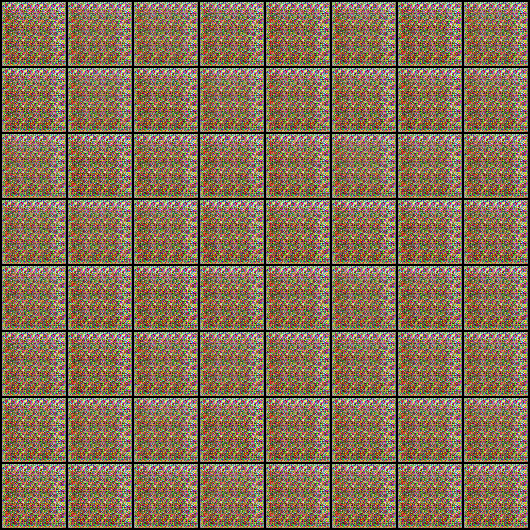

In [ ]:
Image('./generated/generated-images-0141.png')

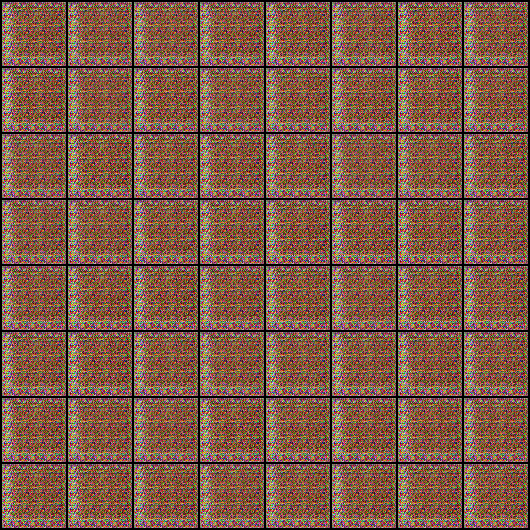

In [ ]:
Image('./generated/generated-images-0200.png')

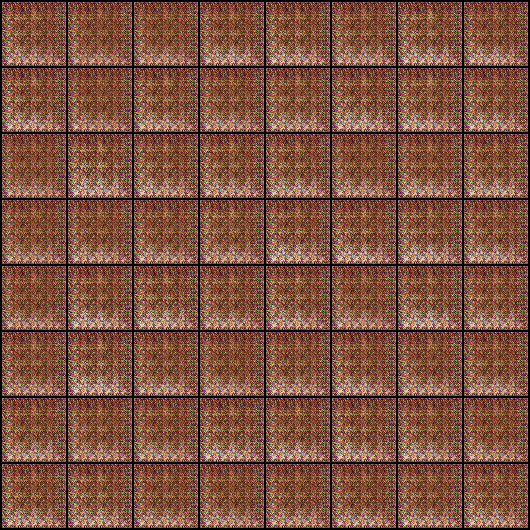

In [ ]:
Image('./generated/generated-images-0241.png')

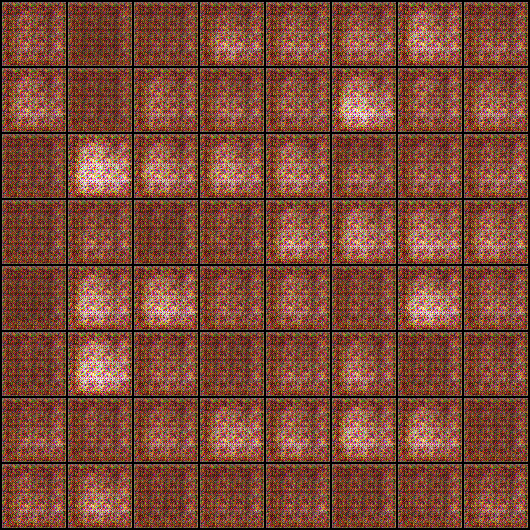

In [ ]:
Image('./generated/generated-images-0281.png')

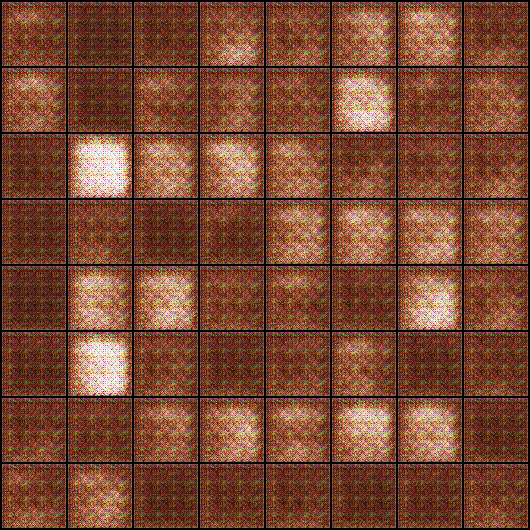

In [ ]:
Image('./generated/generated-images-0300.png')

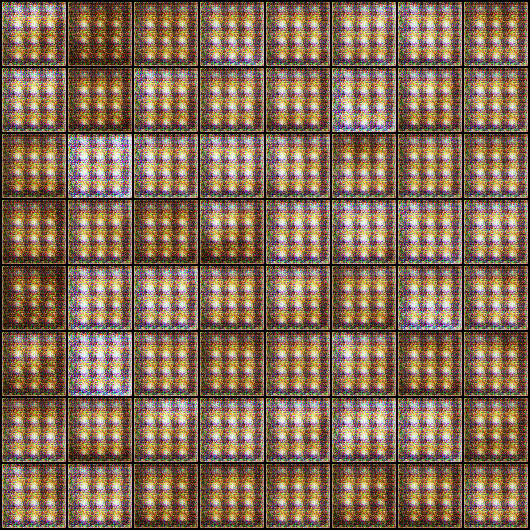

In [ ]:
Image('./generated/generated-images-0430.png')

In [ ]:
import cv2
import os

vid_fname = 'art_gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 5, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

In [ ]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

In [ ]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');